# Proyecto "Estimación de los niveles de obesidad en función de los hábitos alimentarios y la condición física"

Para realizar este proyecto se utilizará el dataset ObesityDataSet_raw_and_data_sinthetic.csv tomado de la página web https://archive.ics.uci.edu/dataset/544/estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition

Importamos las librerías necesarias para el análisis de datos y el entrenamiento del modelo.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import Funciones as f
import modelos as m
import matplotlib.pyplot as plt
import streamlit as st
import plotly.express as px

from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz

import joblib

## Carguemos el Dataset

In [2]:
df=pd.read_csv("ObesityDataSet_raw_and_data_sinthetic.csv")

In [3]:
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


Analizamos los datos que contiene el dataset

In [4]:
f.explorar_df(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

Renombramos columnas

In [5]:
df = df.rename(columns={
    "Gender": "género",
    "Age": "edad",
    "Height": "altura",
    "Weight": "peso",
    "family_history_with_overweight": "f_con_sobrepeso",
    "SMOKE": "fuma",
    "NObeyesdad": "nivel_obesidad"
})


# Diccionario de las variables del estudio:

`género`= género (Femenino/Masculino)

`edad` = edad de la persona

`altura` = altura en metros

`peso` = peso en kilogramos

`f_con_sobrepeso` = antecedentes familiares con sobrepeso, ¿Algún familiar ha sufrido o sufre de sobrepeso?

`FAVC` = ¿Comes frecuentemente alimentos con alto contenido calórico?

`FCVC` = ¿Sueles comer verduras en tus comidas?		

`NCP` =	¿Cuántas comidas principales realizas diariamente?

`CAEC` = ¿Comes algún alimento entre las comidas?	

`fuma` = ¿Fuma usted?

`CH2O` = ¿Cuánta agua bebes diariamente?	

`SCC` =	¿Controlas las calorías que consumes diariamente?	

`FAF` = ¿Con qué frecuencia realizas actividad física?	

`TUE` =	¿Cuánto tiempo utilizas dispositivos tecnológicos como celular, videojuegos, televisión, computadora y otros?

`CALC` = ¿Con qué frecuencia bebes alcohol?	

`MTRANS` = ¿Qué medio de transporte utilizas habitualmente?		

`nivel_obesidad` = Nivel de obesidad

Ahora las columnas son:

In [6]:
df.columns

Index(['género', 'edad', 'altura', 'peso', 'f_con_sobrepeso', 'FAVC', 'FCVC',
       'NCP', 'CAEC', 'fuma', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS',
       'nivel_obesidad'],
      dtype='object')

## Limpieza de los datos

Limpiaremos los datos y veremos los valores en cada columna para su análisis.

In [7]:
f.categorico(df,"nivel_obesidad")

nivel_obesidad
Obesity_Type_I         351
Obesity_Type_III       324
Obesity_Type_II        297
Overweight_Level_I     290
Overweight_Level_II    290
Normal_Weight          287
Insufficient_Weight    272
Name: count, dtype: int64
['Normal_Weight' 'Overweight_Level_I' 'Overweight_Level_II'
 'Obesity_Type_I' 'Insufficient_Weight' 'Obesity_Type_II'
 'Obesity_Type_III']
7


In [8]:
f.asignar_secciones(df)

,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Peso normal
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Peso normal
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Sobrepeso nivel I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesidad tipo III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesidad tipo III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesidad tipo III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesidad tipo III


Veamos la variable a estudiar que es nivel_obesidad

In [9]:
# Definimos el orden lógico de las categorías para el gráfico
orden_categorias = [
    "Peso insuficiente", 
    "Peso normal", 
    "Sobrepeso nivel I", 
    "Sobrepeso nivel II", 
    "Obesidad tipo I", 
    "Obesidad tipo II", 
    "Obesidad tipo III"
]

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Peso insuficiente'),
  Text(1, 0, 'Peso normal'),
  Text(2, 0, 'Sobrepeso nivel I'),
  Text(3, 0, 'Sobrepeso nivel II'),
  Text(4, 0, 'Obesidad tipo I'),
  Text(5, 0, 'Obesidad tipo II'),
  Text(6, 0, 'Obesidad tipo III')])

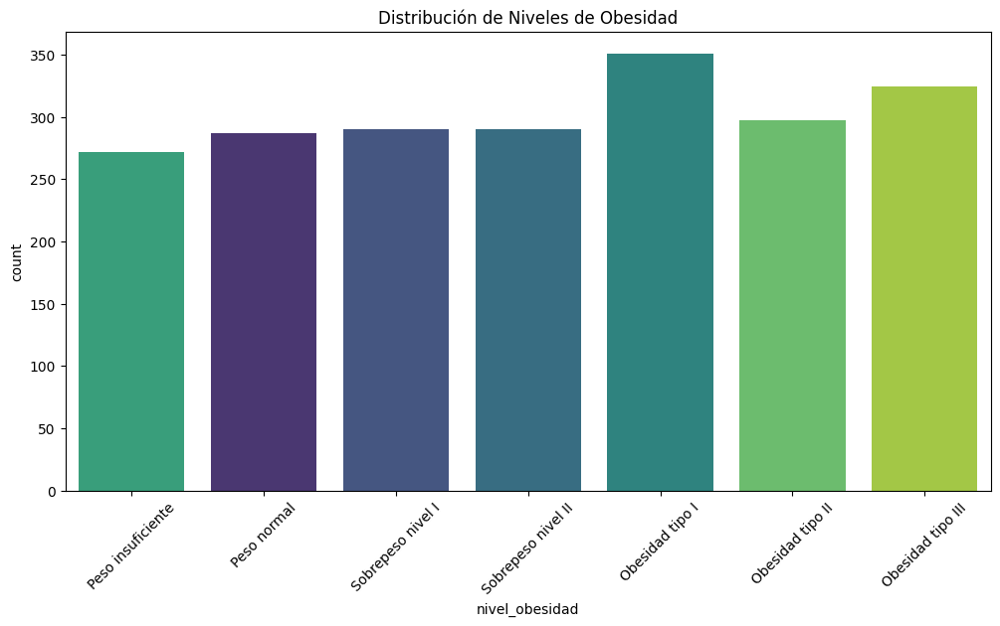

In [10]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='nivel_obesidad', order=orden_categorias, hue='nivel_obesidad', palette="viridis", legend=False)
plt.title('Distribución de Niveles de Obesidad')
plt.xticks(rotation=45)



Veamos duplicados

In [11]:
f.ver_duplicados(df)

,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
98,Female,21.0,1.52,42.0,no,no,3.0,1.0,Frequently,no,1.0,no,0.0,0.0,Sometimes,Public_Transportation,Peso insuficiente
106,Female,25.0,1.57,55.0,no,yes,2.0,1.0,Sometimes,no,2.0,no,2.0,0.0,Sometimes,Public_Transportation,Peso normal
174,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
179,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
184,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
209,Female,22.0,1.69,65.0,yes,yes,2.0,3.0,Sometimes,no,2.0,no,1.0,1.0,Sometimes,Public_Transportation,Peso normal
309,Female,16.0,1.66,58.0,no,no,2.0,1.0,Sometimes,no,1.0,no,0.0,1.0,no,Walking,Peso normal
460,Female,18.0,1.62,55.0,yes,yes,2.0,3.0,Frequently,no,1.0,no,1.0,1.0,no,Public_Transportation,Peso normal
467,Male,22.0,1.74,75.0,yes,yes,3.0,3.0,Frequently,no,1.0,no,1.0,0.0,no,Automobile,Peso normal
496,Male,18.0,1.72,53.0,yes,yes,2.0,3.0,Sometimes,no,2.0,no,0.0,2.0,Sometimes,Public_Transportation,Peso insuficiente


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
98,Female,21.0,1.52,42.0,no,no,3.0,1.0,Frequently,no,1.0,no,0.0,0.0,Sometimes,Public_Transportation,Peso insuficiente
106,Female,25.0,1.57,55.0,no,yes,2.0,1.0,Sometimes,no,2.0,no,2.0,0.0,Sometimes,Public_Transportation,Peso normal
174,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
179,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
184,Male,21.0,1.62,70.0,no,yes,2.0,1.0,no,no,3.0,no,1.0,0.0,Sometimes,Public_Transportation,Sobrepeso nivel I
209,Female,22.0,1.69,65.0,yes,yes,2.0,3.0,Sometimes,no,2.0,no,1.0,1.0,Sometimes,Public_Transportation,Peso normal
309,Female,16.0,1.66,58.0,no,no,2.0,1.0,Sometimes,no,1.0,no,0.0,1.0,no,Walking,Peso normal
460,Female,18.0,1.62,55.0,yes,yes,2.0,3.0,Frequently,no,1.0,no,1.0,1.0,no,Public_Transportation,Peso normal
467,Male,22.0,1.74,75.0,yes,yes,3.0,3.0,Frequently,no,1.0,no,1.0,0.0,no,Automobile,Peso normal
496,Male,18.0,1.72,53.0,yes,yes,2.0,3.0,Sometimes,no,2.0,no,0.0,2.0,Sometimes,Public_Transportation,Peso insuficiente


Borramos los duplicados del dataset

In [12]:
df_clean = df.drop_duplicates()

In [13]:
df_clean.shape

(2087, 17)

Observamos como se distribuyen los datos en la columna 'nivel_obesidad'

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Peso insuficiente'),
  Text(1, 0, 'Peso normal'),
  Text(2, 0, 'Sobrepeso nivel I'),
  Text(3, 0, 'Sobrepeso nivel II'),
  Text(4, 0, 'Obesidad tipo I'),
  Text(5, 0, 'Obesidad tipo II'),
  Text(6, 0, 'Obesidad tipo III')])

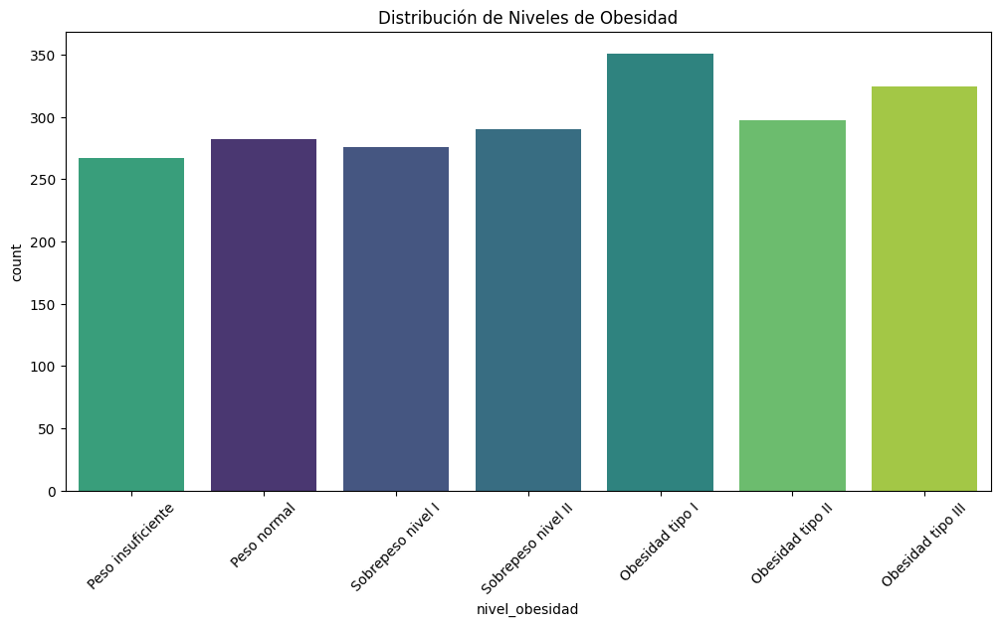

In [14]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df_clean, x='nivel_obesidad', order=orden_categorias, hue='nivel_obesidad', palette="viridis", legend=False)
plt.title('Distribución de Niveles de Obesidad')
plt.xticks(rotation=45)

Al observar la variable 'nivel_obesidad' vemos que mantiene una homogeneidad en su distribución, por lo que no es necesario realizar ninguna adecuación o agregar elementos.

In [15]:
f.categorico(df_clean,"CAEC")

CAEC
Sometimes     1761
Frequently     236
Always          53
no              37
Name: count, dtype: int64
['Sometimes' 'Frequently' 'Always' 'no']
4


Llevamos nuestras variables de estudio al lenguaje español.

In [16]:
f.cambio(df_clean,'CAEC')

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(valores)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,A veces,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Peso normal
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Peso normal
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,A veces,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Sobrepeso nivel I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,A veces,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,A veces,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesidad tipo III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,A veces,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesidad tipo III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,A veces,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesidad tipo III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,A veces,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesidad tipo III


In [17]:
f.categorico(df_clean,'género')

género
Male      1052
Female    1035
Name: count, dtype: int64
['Female' 'Male']
2


In [18]:
f.se(df_clean,'género')

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(num)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,yes,no,3.0,3.0,A veces,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,no,no,3.0,3.0,A veces,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,no,no,2.0,1.0,A veces,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,A veces,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,A veces,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,A veces,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,A veces,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesidad tipo III


In [19]:
f.categorico(df_clean,'CALC')

CALC
Sometimes     1380
no             636
Frequently      70
Always           1
Name: count, dtype: int64
['no' 'Sometimes' 'Frequently' 'Always']
4


In [20]:
f.cambio(df_clean,'CALC')

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(valores)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,yes,no,3.0,3.0,A veces,yes,3.000000,yes,3.000000,0.000000,A veces,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,yes,no,2.0,3.0,A veces,no,2.000000,no,2.000000,1.000000,Con frecuencia,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,no,no,3.0,3.0,A veces,no,2.000000,no,2.000000,0.000000,Con frecuencia,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,no,no,2.0,1.0,A veces,no,2.000000,no,0.000000,0.000000,A veces,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,A veces,no,1.728139,no,1.676269,0.906247,A veces,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,A veces,no,2.005130,no,1.341390,0.599270,A veces,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,A veces,no,2.054193,no,1.414209,0.646288,A veces,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,A veces,no,2.852339,no,1.139107,0.586035,A veces,Public_Transportation,Obesidad tipo III


In [21]:
f.categorico(df_clean,"FCVC")

FCVC
3.000000    647
2.000000    581
1.000000     33
2.971574      2
2.630137      2
           ... 
2.886260      1
2.658112      1
2.027574      1
1.123939      1
2.591439      1
Name: count, Length: 810, dtype: int64
[2.       3.       1.       2.450218 2.880161 2.00876  2.596579 2.591439
 2.392665 1.123939 2.027574 2.658112 2.88626  2.714447 2.750715 1.4925
 2.205439 2.059138 2.310423 2.823179 2.052932 2.596364 2.767731 2.815157
 2.737762 2.568063 2.524428 2.971574 1.0816   1.270448 1.344854 2.959658
 2.725282 2.844607 2.44004  2.432302 2.592247 2.449267 2.929889 2.015258
 1.031149 1.592183 1.21498  1.522001 2.703436 2.362918 2.14084  2.5596
 2.336044 1.813234 2.724285 2.71897  1.133844 1.757466 2.979383 2.204914
 2.927218 2.88853  2.890535 2.530066 2.241606 1.003566 2.652779 2.897899
 2.483979 2.945967 2.478891 2.784464 1.005578 2.938031 2.842102 1.889199
 2.943749 2.33998  1.950742 2.277436 2.371338 2.984425 2.977018 2.663421
 2.753752 2.318355 2.594653 2.886157 2.967853 2.619835

In [22]:
f.categorico(df_clean,'f_con_sobrepeso')

f_con_sobrepeso
yes    1722
no      365
Name: count, dtype: int64
['yes' 'no']
2


In [23]:
f.si_no(df_clean,"f_con_sobrepeso")

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(afirmacion)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,Si,no,2.0,3.0,A veces,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,Si,no,3.0,3.0,A veces,yes,3.000000,yes,3.000000,0.000000,A veces,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,Si,no,2.0,3.0,A veces,no,2.000000,no,2.000000,1.000000,Con frecuencia,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,No,no,3.0,3.0,A veces,no,2.000000,no,2.000000,0.000000,Con frecuencia,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,No,no,2.0,1.0,A veces,no,2.000000,no,0.000000,0.000000,A veces,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,Si,yes,3.0,3.0,A veces,no,1.728139,no,1.676269,0.906247,A veces,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,Si,yes,3.0,3.0,A veces,no,2.005130,no,1.341390,0.599270,A veces,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,Si,yes,3.0,3.0,A veces,no,2.054193,no,1.414209,0.646288,A veces,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,Si,yes,3.0,3.0,A veces,no,2.852339,no,1.139107,0.586035,A veces,Public_Transportation,Obesidad tipo III


In [24]:
f.si_no(df_clean,"fuma")

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(afirmacion)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,Si,no,2.0,3.0,A veces,No,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,Si,no,3.0,3.0,A veces,Si,3.000000,yes,3.000000,0.000000,A veces,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,Si,no,2.0,3.0,A veces,No,2.000000,no,2.000000,1.000000,Con frecuencia,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,No,no,3.0,3.0,A veces,No,2.000000,no,2.000000,0.000000,Con frecuencia,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,No,no,2.0,1.0,A veces,No,2.000000,no,0.000000,0.000000,A veces,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,Si,yes,3.0,3.0,A veces,No,1.728139,no,1.676269,0.906247,A veces,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,Si,yes,3.0,3.0,A veces,No,2.005130,no,1.341390,0.599270,A veces,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,Si,yes,3.0,3.0,A veces,No,2.054193,no,1.414209,0.646288,A veces,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,Si,yes,3.0,3.0,A veces,No,2.852339,no,1.139107,0.586035,A veces,Public_Transportation,Obesidad tipo III


In [25]:
f.si_no(df_clean,"FAVC")

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(afirmacion)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,Si,No,2.0,3.0,A veces,No,2.000000,no,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,Si,No,3.0,3.0,A veces,Si,3.000000,yes,3.000000,0.000000,A veces,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,Si,No,2.0,3.0,A veces,No,2.000000,no,2.000000,1.000000,Con frecuencia,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,No,No,3.0,3.0,A veces,No,2.000000,no,2.000000,0.000000,Con frecuencia,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,No,No,2.0,1.0,A veces,No,2.000000,no,0.000000,0.000000,A veces,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,Si,Si,3.0,3.0,A veces,No,1.728139,no,1.676269,0.906247,A veces,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,Si,Si,3.0,3.0,A veces,No,2.005130,no,1.341390,0.599270,A veces,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,Si,Si,3.0,3.0,A veces,No,2.054193,no,1.414209,0.646288,A veces,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,Si,Si,3.0,3.0,A veces,No,2.852339,no,1.139107,0.586035,A veces,Public_Transportation,Obesidad tipo III


In [26]:
f.si_no(df_clean,"SCC")

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(afirmacion)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,Si,No,2.0,3.0,A veces,No,2.000000,No,0.000000,1.000000,no,Public_Transportation,Peso normal
1,femenino,21.000000,1.520000,56.000000,Si,No,3.0,3.0,A veces,Si,3.000000,Si,3.000000,0.000000,A veces,Public_Transportation,Peso normal
2,masculino,23.000000,1.800000,77.000000,Si,No,2.0,3.0,A veces,No,2.000000,No,2.000000,1.000000,Con frecuencia,Public_Transportation,Peso normal
3,masculino,27.000000,1.800000,87.000000,No,No,3.0,3.0,A veces,No,2.000000,No,2.000000,0.000000,Con frecuencia,Walking,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,No,No,2.0,1.0,A veces,No,2.000000,No,0.000000,0.000000,A veces,Public_Transportation,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,Si,Si,3.0,3.0,A veces,No,1.728139,No,1.676269,0.906247,A veces,Public_Transportation,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,Si,Si,3.0,3.0,A veces,No,2.005130,No,1.341390,0.599270,A veces,Public_Transportation,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,Si,Si,3.0,3.0,A veces,No,2.054193,No,1.414209,0.646288,A veces,Public_Transportation,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,Si,Si,3.0,3.0,A veces,No,2.852339,No,1.139107,0.586035,A veces,Public_Transportation,Obesidad tipo III


In [27]:
f.categorico(df_clean,"MTRANS")

MTRANS
Public_Transportation    1558
Automobile                456
Walking                    55
Motorbike                  11
Bike                        7
Name: count, dtype: int64
['Public_Transportation' 'Walking' 'Automobile' 'Motorbike' 'Bike']
5


In [28]:
f.traspaso(df_clean,"MTRANS")

c:\Users\tachi\Documents\git\Proyecto-Estudio-Obesidad\Estudio\Funciones.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(sig)


,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.000000,1.620000,64.000000,Si,No,2.0,3.0,A veces,No,2.000000,No,0.000000,1.000000,no,transporte público,Peso normal
1,femenino,21.000000,1.520000,56.000000,Si,No,3.0,3.0,A veces,Si,3.000000,Si,3.000000,0.000000,A veces,transporte público,Peso normal
2,masculino,23.000000,1.800000,77.000000,Si,No,2.0,3.0,A veces,No,2.000000,No,2.000000,1.000000,Con frecuencia,transporte público,Peso normal
3,masculino,27.000000,1.800000,87.000000,No,No,3.0,3.0,A veces,No,2.000000,No,2.000000,0.000000,Con frecuencia,a pie,Sobrepeso nivel I
4,masculino,22.000000,1.780000,89.800000,No,No,2.0,1.0,A veces,No,2.000000,No,0.000000,0.000000,A veces,transporte público,Sobrepeso nivel II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,femenino,20.976842,1.710730,131.408528,Si,Si,3.0,3.0,A veces,No,1.728139,No,1.676269,0.906247,A veces,transporte público,Obesidad tipo III
2107,femenino,21.982942,1.748584,133.742943,Si,Si,3.0,3.0,A veces,No,2.005130,No,1.341390,0.599270,A veces,transporte público,Obesidad tipo III
2108,femenino,22.524036,1.752206,133.689352,Si,Si,3.0,3.0,A veces,No,2.054193,No,1.414209,0.646288,A veces,transporte público,Obesidad tipo III
2109,femenino,24.361936,1.739450,133.346641,Si,Si,3.0,3.0,A veces,No,2.852339,No,1.139107,0.586035,A veces,transporte público,Obesidad tipo III


In [29]:
f.categorico(df_clean,"nivel_obesidad")

nivel_obesidad
Obesidad tipo I       351
Obesidad tipo III     324
Obesidad tipo II      297
Sobrepeso nivel II    290
Peso normal           282
Sobrepeso nivel I     276
Peso insuficiente     267
Name: count, dtype: int64
['Peso normal' 'Sobrepeso nivel I' 'Sobrepeso nivel II' 'Obesidad tipo I'
 'Peso insuficiente' 'Obesidad tipo II' 'Obesidad tipo III']
7


In [30]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   género           2087 non-null   object 
 1   edad             2087 non-null   float64
 2   altura           2087 non-null   float64
 3   peso             2087 non-null   float64
 4   f_con_sobrepeso  2087 non-null   object 
 5   FAVC             2087 non-null   object 
 6   FCVC             2087 non-null   float64
 7   NCP              2087 non-null   float64
 8   CAEC             2087 non-null   object 
 9   fuma             2087 non-null   object 
 10  CH2O             2087 non-null   float64
 11  SCC              2087 non-null   object 
 12  FAF              2087 non-null   float64
 13  TUE              2087 non-null   float64
 14  CALC             2087 non-null   object 
 15  MTRANS           2087 non-null   object 
 16  nivel_obesidad   2087 non-null   object 
dtypes: float64(8), obje

# Data set de trabajo nos queda con 2087 datos sin nulos, ni duplicados. Listo para comenzar el análisis.

In [31]:
df_clean.head()

,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,femenino,21.0,1.62,64.0,Si,No,2.0,3.0,A veces,No,2.0,No,0.0,1.0,no,transporte público,Peso normal
1,femenino,21.0,1.52,56.0,Si,No,3.0,3.0,A veces,Si,3.0,Si,3.0,0.0,A veces,transporte público,Peso normal
2,masculino,23.0,1.80,77.0,Si,No,2.0,3.0,A veces,No,2.0,No,2.0,1.0,Con frecuencia,transporte público,Peso normal
3,masculino,27.0,1.80,87.0,No,No,3.0,3.0,A veces,No,2.0,No,2.0,0.0,Con frecuencia,a pie,Sobrepeso nivel I
4,masculino,22.0,1.78,89.8,No,No,2.0,1.0,A veces,No,2.0,No,0.0,0.0,A veces,transporte público,Sobrepeso nivel II


Generamos el nuevo csv de estudio con todos los datos a analizar

In [32]:
df_clean.to_csv('ObesityDataSet_clean.csv', index=False)

# Análisis exploratorio para el estudio de la obesidad 

Analicemos el genero de nuestra base de datos con un gráfico circular

In [33]:
# Contamos las frecuencias
df_counts = df_clean['género'].value_counts().reset_index()
df_counts.columns = ['género', 'cantidad']

# Graficamos usando la columna de números 'cantidad'
fig = px.pie(
    df_counts, 
    names='género', 
    values='cantidad', 
    title="Distribución por Género",
    hole=0.3,
    color_discrete_sequence=px.colors.qualitative.Pastel
)
fig.show()


Análisis univariado de las variables numéricas

In [34]:
df_numerales=df_clean.select_dtypes(include=['int64', 'float64'])

In [35]:
df_numerales.columns

Index(['edad', 'altura', 'peso', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE'], dtype='object')

Veamos sus distribución

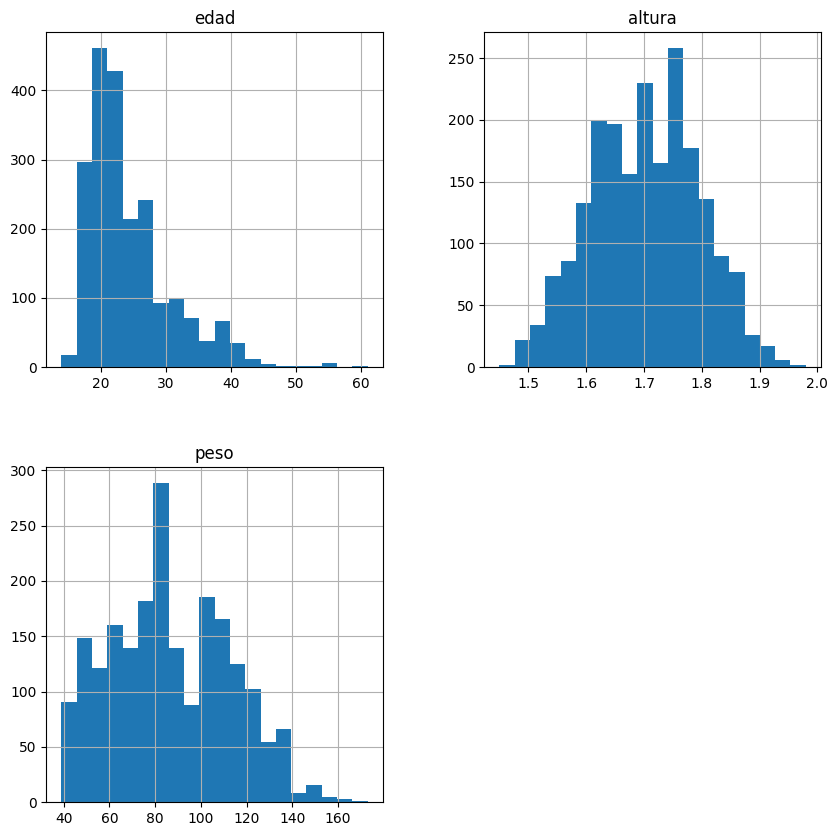

In [36]:
dfgrafico=df_clean[['edad','altura','peso']]
dfgrafico.hist(bins=20, figsize=(10,10))
plt.show()

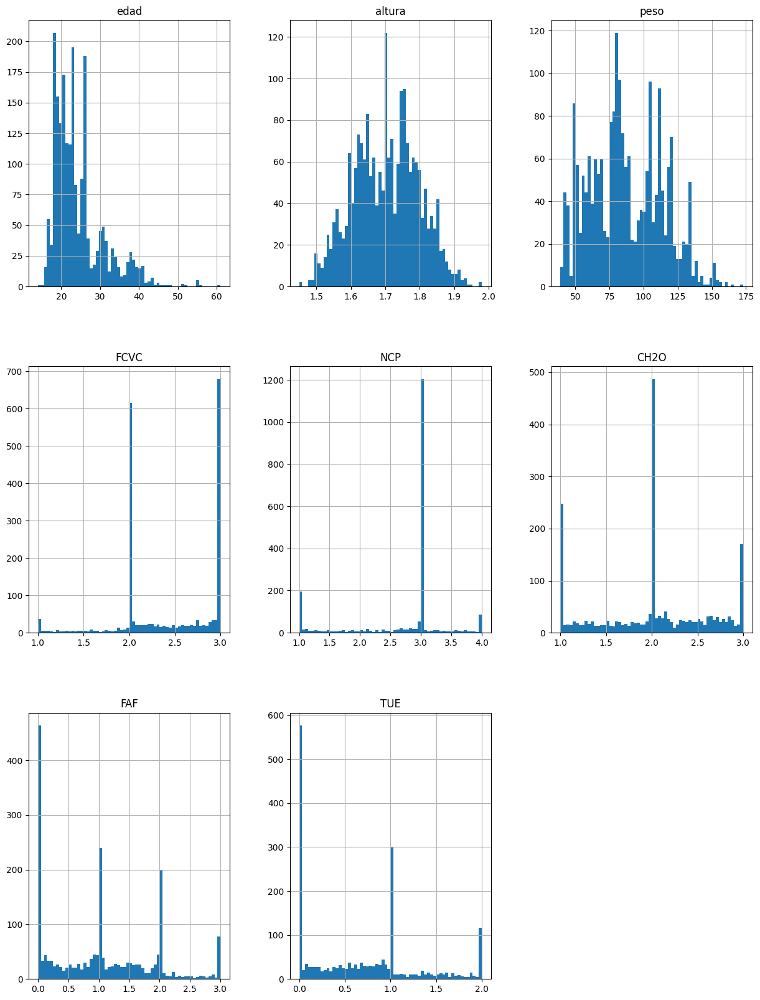

In [37]:
df_numerales.hist(figsize=(15, 20), bins=60, xlabelsize=10, ylabelsize=10);

Observemos si los datos de estudio estan normalizados observando la gráfica QQ

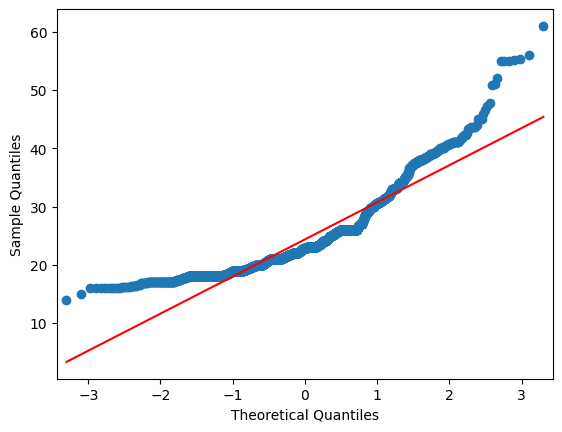

In [38]:
import statsmodels.api as sm
sm.qqplot(df_clean['edad'], line='s');

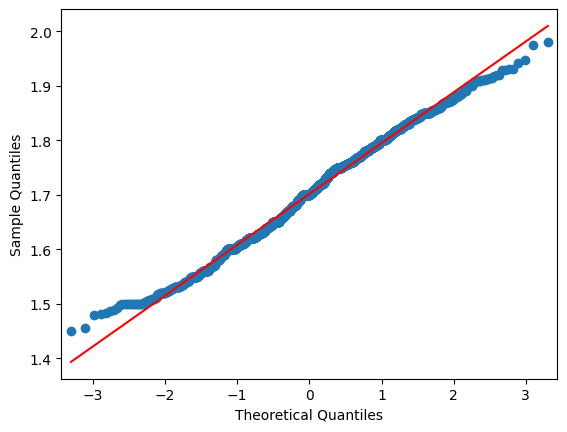

In [39]:
sm.qqplot(df['altura'], line='s');

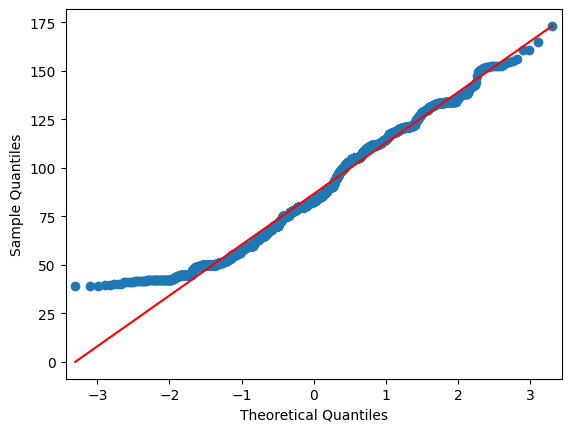

In [40]:
sm.qqplot(df['peso'], line='s');

Veamos la relación peso altura con respecto al nivel de obesidad

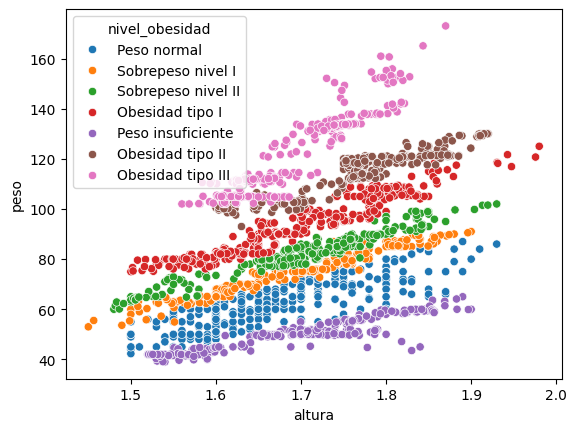

In [41]:
sns.scatterplot(data=df_clean, x='altura', y='peso', hue='nivel_obesidad')
plt.show()

# Investigación del análisis de datos 

Trabajaremos el dataset para el estudio de máquinas de aprendizaje (machine learning) para predecir el nivel de obesidad de una persona en función de sus hábitos alimenticios y su condición física.
Para esto hemos investigado la clasificación de los pesos en función del IMC, en la organización mundial de la salud (https://apps.who.int/nutrition/landscape/help.aspx?menu=0&helpid=420#:~:text=BMI%20%3C18.5:%20underweight,BMI%20%E2%89%A530.0:%20obesity.).

El IMC es un índice simple de peso/talla que se utiliza comúnmente para clasificar el bajo peso, el sobrepeso y la obesidad en adultos. Se define como el peso en kilogramos dividido entre el cuadrado de la altura en metros (kg/m² ) . Por ejemplo, un adulto que pesa 58 kg y mide 1,70 m tendrá un IMC de 20,1: IMC = 58 kg/(1,70 m ´ 1,70 m) = 20,1


| Rango IMC (kg/m²) |
| :--- |
| < 17,0 indica delgadez moderada y severa |
| < 18,5 indica bajo peso|
| 18,5 a 24,9 indica un peso normal|
| ≥ 25,0 indica sobrepeso |
| ≥ 30,0 indica obesidad |

como este estudio se centra en la obesidad se han definido 7 categorías que son:



| Categoría | Rango IMC (kg/m²) |
| :--- | :--- |
| Peso insuficiente | < 18.5 |
| Peso normal | 18.5 – 24.9 |
| Sobrepeso nivel I (Preobesidad leve) | 25.0 – 26.9 |
| Sobrepeso nivel II (Preobesidad moderada) | 27.0 – 29.9 |
| Obesidad tipo I (Moderada) | 30.0 – 34.9 |
| Obesidad tipo II (Severa) | 35.0 – 39.9 |
| Obesidad tipo III (Mórbida) | ≥ 40.0 |


# Haremos un estudio de KNN solo con los datos numéricos que tenemos

In [42]:
df_analisis=df[[ "edad","altura","peso","FCVC","NCP","CH2O","FAF","TUE","nivel_obesidad"]]

Analizemos la relación entre las variables numéricas y el nivel de obesidad

In [43]:
analisis = df_analisis.drop("nivel_obesidad", axis=1)

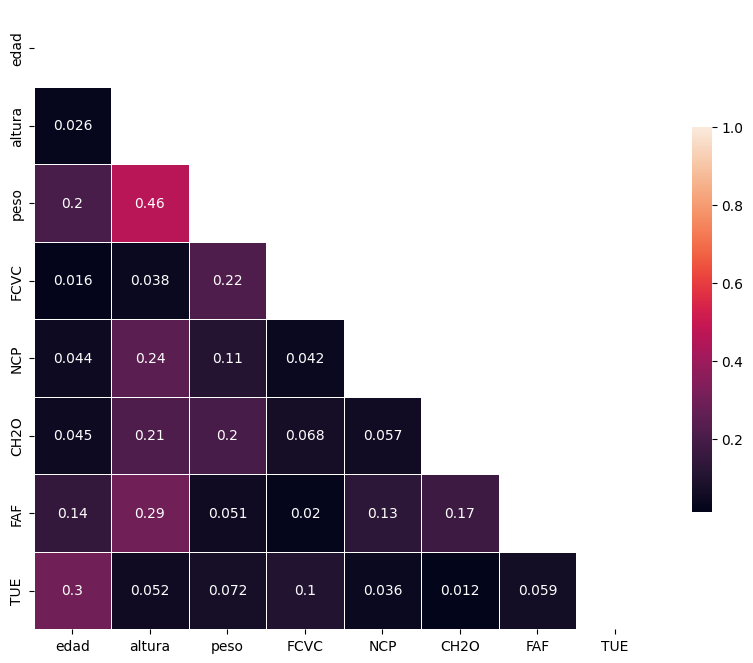

In [44]:
f.corr_heatmap(analisis)

Vemos las variables que se relacionan más como peso con altura, edad con TUE (tiempo en actividades como pc, móvil,etc.), altura con FAF(Actividades físicas), peso con FCVC (comer verduras)

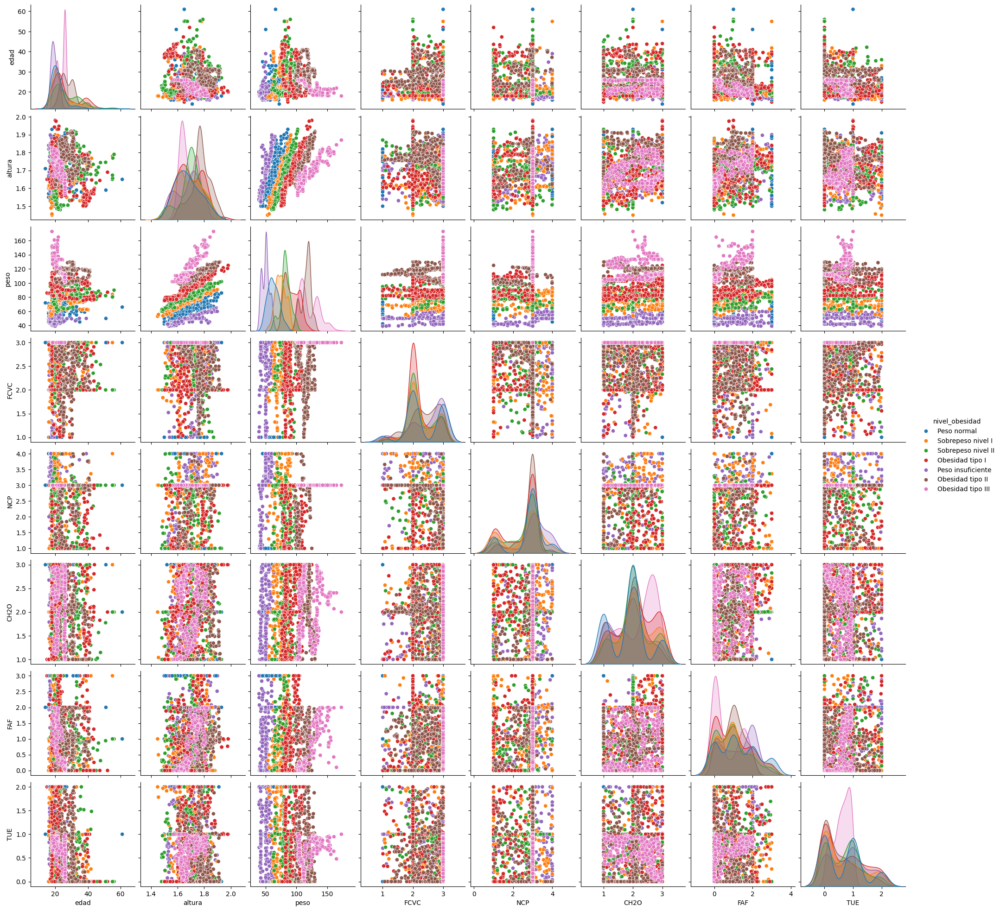

In [45]:
sns.pairplot(df_analisis, hue="nivel_obesidad")
plt.show()

Analicemos que ocurre con el estudio de KNN con solo los datos numéricos.

In [46]:
m.knn(df_analisis,"nivel_obesidad",3)

Accuracy:
0.8628841607565012
Precision:
0.8590173072286527
Recall:
0.8558117364515408
F1-score:
0.8531944578832311
Confusion Matrix:
[[63  0  1  0  1  0  2]
 [ 0 52  1  0  0  0  0]
 [ 0  1 68  0  0  0  0]
 [ 0  0  0 63  2  0  0]
 [ 1  0  0 15 30 10  1]
 [ 1  0  0  1  6 47  2]
 [ 8  1  0  0  3  1 42]]


# Ahora haremos el estudio de KNN con mapeo de las variables considerando todos los datos.

Pasamos todas las variables a numéricas con mapeo

In [47]:
df_estudio=f.traspaso_estudio(df_clean)

In [48]:
df_estudio

,género,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,NCP,CAEC,fuma,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,0,21.000000,1.620000,64.000000,1,0,2.0,3.0,1,0,2.000000,0,0.000000,1.000000,0,0,1
1,0,21.000000,1.520000,56.000000,1,0,3.0,3.0,1,1,3.000000,1,3.000000,0.000000,1,0,1
2,1,23.000000,1.800000,77.000000,1,0,2.0,3.0,1,0,2.000000,0,2.000000,1.000000,2,0,1
3,1,27.000000,1.800000,87.000000,0,0,3.0,3.0,1,0,2.000000,0,2.000000,0.000000,2,2,2
4,1,22.000000,1.780000,89.800000,0,0,2.0,1.0,1,0,2.000000,0,0.000000,0.000000,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,20.976842,1.710730,131.408528,1,1,3.0,3.0,1,0,1.728139,0,1.676269,0.906247,1,0,6
2107,0,21.982942,1.748584,133.742943,1,1,3.0,3.0,1,0,2.005130,0,1.341390,0.599270,1,0,6
2108,0,22.524036,1.752206,133.689352,1,1,3.0,3.0,1,0,2.054193,0,1.414209,0.646288,1,0,6
2109,0,24.361936,1.739450,133.346641,1,1,3.0,3.0,1,0,2.852339,0,1.139107,0.586035,1,0,6


In [49]:
df_estudio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   género           2087 non-null   int64  
 1   edad             2087 non-null   float64
 2   altura           2087 non-null   float64
 3   peso             2087 non-null   float64
 4   f_con_sobrepeso  2087 non-null   int64  
 5   FAVC             2087 non-null   int64  
 6   FCVC             2087 non-null   float64
 7   NCP              2087 non-null   float64
 8   CAEC             2087 non-null   int64  
 9   fuma             2087 non-null   int64  
 10  CH2O             2087 non-null   float64
 11  SCC              2087 non-null   int64  
 12  FAF              2087 non-null   float64
 13  TUE              2087 non-null   float64
 14  CALC             2087 non-null   int64  
 15  MTRANS           2087 non-null   int64  
 16  nivel_obesidad   2087 non-null   int64  
dtypes: float64(8), int6

Veamos como es la relación de las variables numéricas con el nivel de obesidad

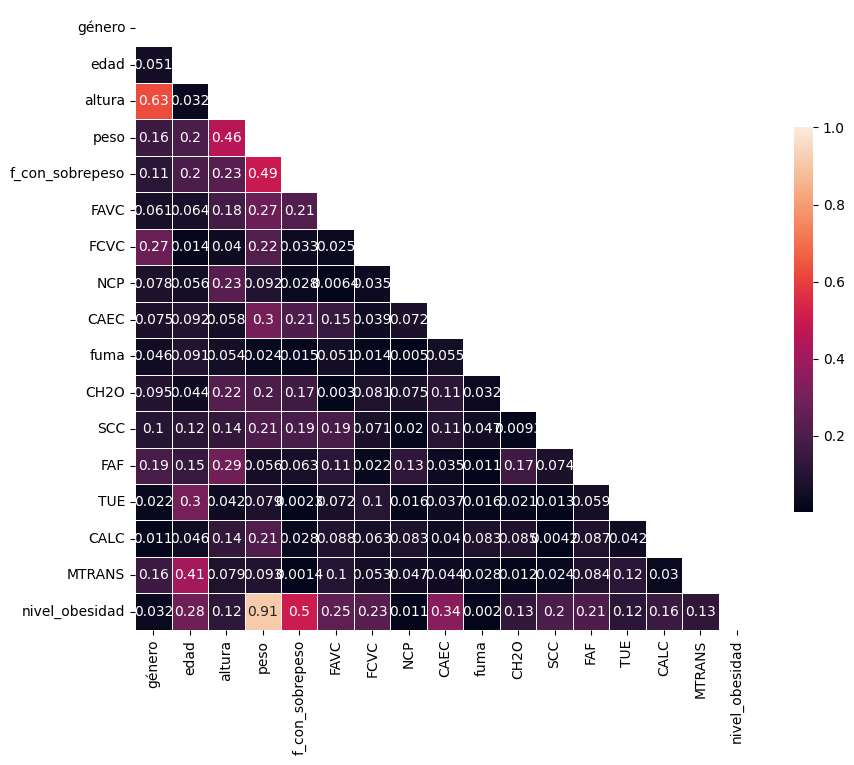

In [50]:
f.corr_heatmap(df_estudio)

Observamos que las variables que menos influyen en el nivel de obesidad son: género, NCP (Comidas principales), fuma.

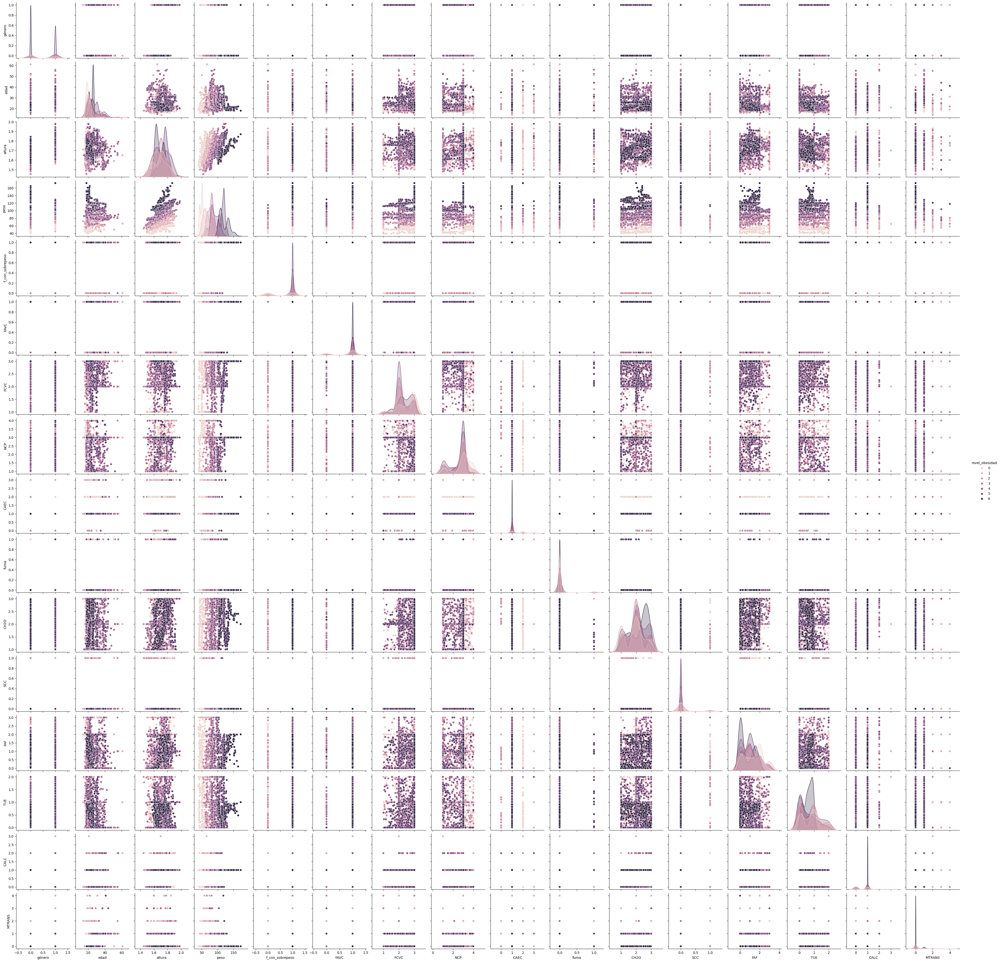

In [51]:
sns.pairplot(df_estudio, hue="nivel_obesidad")
plt.show()

Veamos el test de KNN para este estudio

In [52]:
m.knn(df_estudio,'nivel_obesidad',3)

Accuracy:
0.8827751196172249
Precision:
0.8732437845577152
Recall:
0.8732506045896619
F1-score:
0.8668122054678337
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [11 26  9  3  2  0  0]
 [ 1  2 49  4  0  0  0]
 [ 0  2  2 52  2  2  0]
 [ 0  0  1  3 70  0  1]
 [ 0  0  0  0  1 68  1]
 [ 0  0  0  0  0  0 60]]


# Ahora haremos un KNN haciendo un estudio de la variable a predecir

Haremos el mapa de correlación del data analisis para determinar cuales son las variables con mayor correlación con la variable a predecir

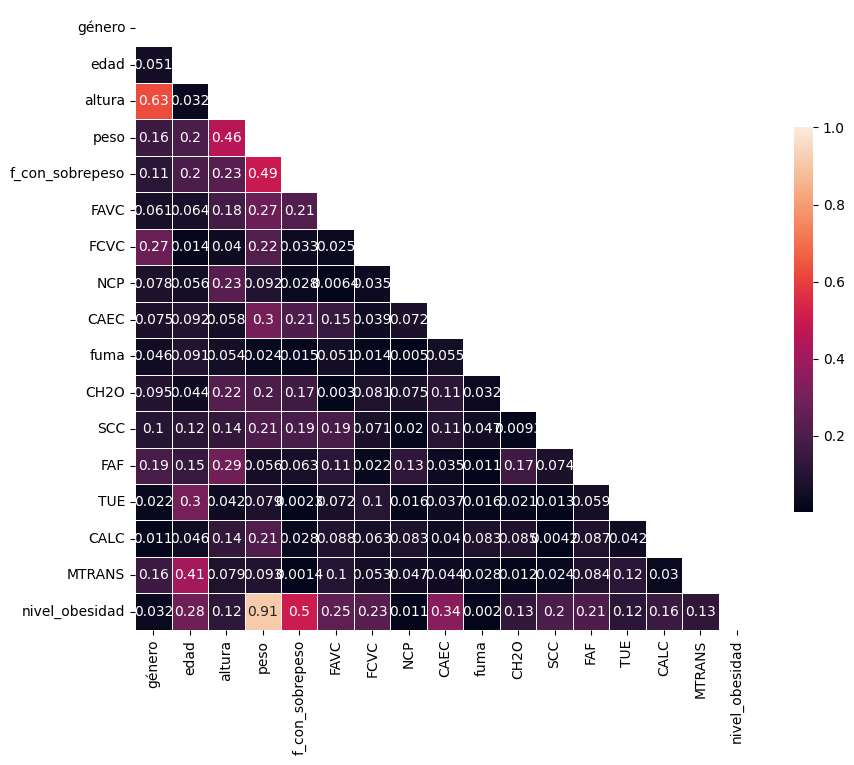

In [53]:
f.corr_heatmap(df_estudio)


Mediante la matriz de correlación, podemos ver que:
- "género", "NCP"(número de comidas principales) y "fuma" tienen una correlación bastante baja con nuestra variable objetivo que es el nivel de obesidad, por lo que las eliminaremos de nuestras características seleccionadas.

In [54]:
df_nuevo=df_estudio.drop(['género','NCP','fuma'], axis=1)

In [55]:
df_nuevo.head()

,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,CAEC,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad
0,21.0,1.62,64.0,1,0,2.0,1,2.0,0,0.0,1.0,0,0,1
1,21.0,1.52,56.0,1,0,3.0,1,3.0,1,3.0,0.0,1,0,1
2,23.0,1.80,77.0,1,0,2.0,1,2.0,0,2.0,1.0,2,0,1
3,27.0,1.80,87.0,0,0,3.0,1,2.0,0,2.0,0.0,2,2,2
4,22.0,1.78,89.8,0,0,2.0,1,2.0,0,0.0,0.0,1,0,3


Aplicamos KNN en este nuevo dataset con los datos que tienen mayor correlación con el objetivo.

In [56]:
m.knn(df_nuevo,"nivel_obesidad",5)

Accuracy:
0.861244019138756
Precision:
0.8516450239143064
Recall:
0.8506959305461316
F1-score:
0.8420297081033665
Confusion Matrix:
[[45  1  0  0  0  0  0]
 [12 22  7  8  2  0  0]
 [ 0  2 48  6  0  0  0]
 [ 0  3  2 49  4  2  0]
 [ 0  0  1  3 70  0  1]
 [ 0  0  0  0  0 68  2]
 [ 0  0  0  0  0  2 58]]


# Haremos el estudio de los datos solo transformando las variables a numéricas

Veamos el KNN de este nuevo dataset con solo variables numéricas que nos permitan hacer predicciones

In [57]:
# Haremos la transformación de las variables categóricas en variables numéricas
df_en = pd.get_dummies(df_clean, columns=['género', 'MTRANS','f_con_sobrepeso', 'FAVC', 'fuma', 'SCC'], drop_first=True)

In [58]:
# Haremos la transformación de las variables categóricas en variables las que siguen un orden 

df_en=f.cambiar(df_en)


In [59]:
df_en.head()

,edad,altura,peso,FCVC,NCP,CAEC,CH2O,FAF,TUE,CALC,nivel_obesidad,género_masculino,MTRANS_automóvil,MTRANS_bicicleta,MTRANS_motocicleta,MTRANS_transporte público,f_con_sobrepeso_Si,FAVC_Si,fuma_Si,SCC_Si
0,21.0,1.62,64.0,2.0,3.0,1,2.0,0.0,1.0,0,1,False,False,False,False,True,True,False,False,False
1,21.0,1.52,56.0,3.0,3.0,1,3.0,3.0,0.0,1,1,False,False,False,False,True,True,False,True,True
2,23.0,1.80,77.0,2.0,3.0,1,2.0,2.0,1.0,2,1,True,False,False,False,True,True,False,False,False
3,27.0,1.80,87.0,3.0,3.0,1,2.0,2.0,0.0,2,2,True,False,False,False,False,False,False,False,False
4,22.0,1.78,89.8,2.0,1.0,1,2.0,0.0,0.0,1,3,True,False,False,False,True,False,False,False,False


In [60]:
df_en.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   edad                       2087 non-null   float64
 1   altura                     2087 non-null   float64
 2   peso                       2087 non-null   float64
 3   FCVC                       2087 non-null   float64
 4   NCP                        2087 non-null   float64
 5   CAEC                       2087 non-null   int64  
 6   CH2O                       2087 non-null   float64
 7   FAF                        2087 non-null   float64
 8   TUE                        2087 non-null   float64
 9   CALC                       2087 non-null   int64  
 10  nivel_obesidad             2087 non-null   int64  
 11  género_masculino           2087 non-null   bool   
 12  MTRANS_automóvil           2087 non-null   bool   
 13  MTRANS_bicicleta           2087 non-null   bool   
 1

In [61]:
m.knn(df_en,'nivel_obesidad',3)

Accuracy:
0.8875598086124402
Precision:
0.8765090598590899
Recall:
0.8781825773787776
F1-score:
0.8715920686044295
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [10 26 10  3  2  0  0]
 [ 1  2 50  3  0  0  0]
 [ 0  3  2 53  1  1  0]
 [ 0  0  1  3 70  0  1]
 [ 0  0  0  0  1 68  1]
 [ 0  0  0  0  0  0 60]]


# Haremos el estudio ahora con el dataset con mayor correlación

Mediante la matriz de correlación, podemos ver que:
- "género", "NCP"(número de comidas principales) y "fuma" tienen una correlación bastante baja con nuestra variable objetivo que es el nivel de obesidad, por lo que las eliminaremos de nuestras características seleccionadas.

In [62]:
df_2=df_clean.drop(['género','NCP','fuma'], axis=1)

In [63]:
# Haremos la transformación de las variables categóricas en variables numéricas
df_2 = pd.get_dummies(df_2, columns=['MTRANS', 'f_con_sobrepeso', 'FAVC','SCC'], drop_first=True)

In [64]:
df_2.head()

,edad,altura,peso,FCVC,CAEC,CH2O,FAF,TUE,CALC,nivel_obesidad,MTRANS_automóvil,MTRANS_bicicleta,MTRANS_motocicleta,MTRANS_transporte público,f_con_sobrepeso_Si,FAVC_Si,SCC_Si
0,21.0,1.62,64.0,2.0,A veces,2.0,0.0,1.0,no,Peso normal,False,False,False,True,True,False,False
1,21.0,1.52,56.0,3.0,A veces,3.0,3.0,0.0,A veces,Peso normal,False,False,False,True,True,False,True
2,23.0,1.80,77.0,2.0,A veces,2.0,2.0,1.0,Con frecuencia,Peso normal,False,False,False,True,True,False,False
3,27.0,1.80,87.0,3.0,A veces,2.0,2.0,0.0,Con frecuencia,Sobrepeso nivel I,False,False,False,False,False,False,False
4,22.0,1.78,89.8,2.0,A veces,2.0,0.0,0.0,A veces,Sobrepeso nivel II,False,False,False,True,False,False,False


In [65]:
#variables con un orden 
df_2=f.cambiar(df_2)


In [66]:
df_2.head()

,edad,altura,peso,FCVC,CAEC,CH2O,FAF,TUE,CALC,nivel_obesidad,MTRANS_automóvil,MTRANS_bicicleta,MTRANS_motocicleta,MTRANS_transporte público,f_con_sobrepeso_Si,FAVC_Si,SCC_Si
0,21.0,1.62,64.0,2.0,1,2.0,0.0,1.0,0,1,False,False,False,True,True,False,False
1,21.0,1.52,56.0,3.0,1,3.0,3.0,0.0,1,1,False,False,False,True,True,False,True
2,23.0,1.80,77.0,2.0,1,2.0,2.0,1.0,2,1,False,False,False,True,True,False,False
3,27.0,1.80,87.0,3.0,1,2.0,2.0,0.0,2,2,False,False,False,False,False,False,False
4,22.0,1.78,89.8,2.0,1,2.0,0.0,0.0,1,3,False,False,False,True,False,False,False


In [67]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   edad                       2087 non-null   float64
 1   altura                     2087 non-null   float64
 2   peso                       2087 non-null   float64
 3   FCVC                       2087 non-null   float64
 4   CAEC                       2087 non-null   int64  
 5   CH2O                       2087 non-null   float64
 6   FAF                        2087 non-null   float64
 7   TUE                        2087 non-null   float64
 8   CALC                       2087 non-null   int64  
 9   nivel_obesidad             2087 non-null   int64  
 10  MTRANS_automóvil           2087 non-null   bool   
 11  MTRANS_bicicleta           2087 non-null   bool   
 12  MTRANS_motocicleta         2087 non-null   bool   
 13  MTRANS_transporte público  2087 non-null   bool   
 1

Haremos el modelo de KNN con este dataset

In [68]:
m.knn(df_2,'nivel_obesidad',3)

Accuracy:
0.8803827751196173
Precision:
0.8746459884496299
Recall:
0.8692450023487657
F1-score:
0.859209451106062
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 9 21 11  8  2  0  0]
 [ 1  1 51  3  0  0  0]
 [ 0  1  2 55  1  1  0]
 [ 0  0  1  4 69  0  1]
 [ 0  0  0  0  0 69  1]
 [ 0  0  0  0  0  1 59]]


# Veamos que ocurre si escalamos las variables numéricas del dataset y aplicamos KNN

Partimos del dataset donde tenemos todos los datos listos para el analisis


In [69]:
m.estandar_knn(df_2, 'nivel_obesidad', 5)

--- Resultados KNN (k=5) ---
Accuracy:  0.8110
Precision: 0.7968
Recall:    0.8020
F1-score:  0.7938

Confusion Matrix:
[[42  2  2  0  0  0  0]
 [10 22  9  5  5  0  0]
 [ 1  3 43  5  4  0  0]
 [ 4  2  4 43  3  3  1]
 [ 0  3  6  3 61  1  1]
 [ 0  1  0  1  0 68  0]
 [ 0  0  0  0  0  0 60]]


In [70]:
m.estandar_knn(df_analisis,'nivel_obesidad',5)

--- Resultados KNN (k=5) ---
Accuracy:  0.8132
Precision: 0.8053
Recall:    0.8054
F1-score:  0.8022

Confusion Matrix:
[[58  1  0  0  2  1  5]
 [ 0 53  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 59  3  3  0]
 [ 4  1  0 13 29 10  0]
 [ 2  0  0  1  8 41  5]
 [ 5  1  0  1  3 10 35]]


In [71]:
m.estandar_knn(df_estudio,'nivel_obesidad',5)

--- Resultados KNN (k=5) ---
Accuracy:  0.8373
Precision: 0.8262
Recall:    0.8310
F1-score:  0.8261

Confusion Matrix:
[[41  3  1  1  0  0  0]
 [12 30  2  5  1  1  0]
 [ 3  3 44  1  4  1  0]
 [ 2  3  3 46  3  3  0]
 [ 0  3  5  5 61  0  1]
 [ 0  1  0  1  0 68  0]
 [ 0  0  0  0  0  0 60]]


In [72]:
m.estandar_knn(df_nuevo,"nivel_obesidad",5)

--- Resultados KNN (k=5) ---
Accuracy:  0.8110
Precision: 0.7996
Recall:    0.8078
F1-score:  0.8001

Confusion Matrix:
[[43  2  0  1  0  0  0]
 [12 29  5  4  1  0  0]
 [ 2  7 40  5  2  0  0]
 [ 3  3  4 44  2  3  1]
 [ 1  4  8  4 56  1  1]
 [ 0  1  0  1  1 67  0]
 [ 0  0  0  0  0  0 60]]


In [73]:
m.estandar_knn(df_en,'nivel_obesidad',5)

--- Resultados KNN (k=5) ---
Accuracy:  0.8469
Precision: 0.8405
Recall:    0.8388
F1-score:  0.8304

Confusion Matrix:
[[44  0  2  0  0  0  0]
 [ 9 23  9  5  4  1  0]
 [ 2  1 47  3  3  0  0]
 [ 4  3  1 48  2  2  0]
 [ 0  2  5  4 64  0  0]
 [ 0  0  1  1  0 68  0]
 [ 0  0  0  0  0  0 60]]


# Veamos el árbol de decisión

In [74]:
m.arbol(df_estudio, 'nivel_obesidad', 5)

Accuracy:
0.8229665071770335
Precision:
0.8362076429191573
Recall:
0.8106372114063017
F1-score:
0.8136020283835684
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 4 33  7  7  0  0  0]
 [ 0  1 27 27  1  0  0]
 [ 0  0  2 40 18  0  0]
 [ 0  0  0  0 74  1  0]
 [ 0  0  0  0  3 67  0]
 [ 0  0  0  0  0  0 60]]


In [75]:
m.arbol(df_analisis, 'nivel_obesidad', 5)

Accuracy:
0.817966903073286
Precision:
0.8182761255719447
Recall:
0.8085639478723711
F1-score:
0.8091511837898712
Confusion Matrix:
[[60  2  1  0  0  0  4]
 [ 4 49  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 61  4  0  0]
 [ 0  0  0  2 39 14  2]
 [ 1  0  0  0  3 30 23]
 [15  1  0  0  0  1 38]]


In [76]:
m.arbol(df_nuevo,"nivel_obesidad",5)

Accuracy:
0.8181818181818182
Precision:
0.8317526916022462
Recall:
0.8066916331750091
F1-score:
0.8095952067270733
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 4 33  7  7  0  0  0]
 [ 0  1 27 27  1  0  0]
 [ 0  0  2 40 17  1  0]
 [ 0  0  0  0 73  2  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]


In [77]:
m.arbol(df_2, 'nivel_obesidad', 5)

Accuracy:
0.8181818181818182
Precision:
0.8317526916022462
Recall:
0.8066916331750091
F1-score:
0.8095952067270733
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 4 33  7  7  0  0  0]
 [ 0  1 27 27  1  0  0]
 [ 0  0  2 40 17  1  0]
 [ 0  0  0  0 73  2  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]


In [78]:
m.arbol(df_en, 'nivel_obesidad',5)

Accuracy:
0.8205741626794258
Precision:
0.8350410391796464
Recall:
0.8085963950797711
F1-score:
0.8118101994031529
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 4 33  7  7  0  0  0]
 [ 0  1 27 27  1  0  0]
 [ 0  0  2 40 18  0  0]
 [ 0  0  0  0 74  1  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]


In [79]:
import os
# Ajusta esta ruta a donde se haya instalado Graphviz en tu PC
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin'


In [80]:
m.dibujo(df_en,'nivel_obesidad',5)

'arbol.png'

# Haremos logistic regression

In [81]:
m.logi_reg(df_analisis,'nivel_obesidad')

Accuracy:
0.8723404255319149
Precision:
0.8689529614323724
Recall:
0.8643172022116427
F1-score:
0.8653797773388104
Confusion Matrix:
[[62  0  1  0  0  0  4]
 [ 1 49  3  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 65  0  0  0]
 [ 0  0  0  8 44  5  0]
 [ 0  0  0  0  7 41  9]
 [ 3  0  0  0  0 13 39]]


In [82]:
m.logi_reg(df_2,'nivel_obesidad')

Accuracy:
0.8851674641148325
Precision:
0.8874182762999177
Recall:
0.8835954381752701
F1-score:
0.8815790199804783
Confusion Matrix:
[[46  0  0  0  0  0  0]
 [ 5 36  7  3  0  0  0]
 [ 0  3 47  6  0  0  0]
 [ 0  0 10 48  2  0  0]
 [ 0  0  0  5 63  7  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [83]:
m.logi_reg(df_estudio, 'nivel_obesidad')

Accuracy:
0.8923444976076556
Precision:
0.8895017591546529
Recall:
0.8899799919967987
F1-score:
0.8882535587314484
Confusion Matrix:
[[46  0  0  0  0  0  0]
 [ 4 38  6  3  0  0  0]
 [ 0  4 46  6  0  0  0]
 [ 0  1  7 47  4  0  1]
 [ 0  0  0  4 66  5  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [84]:
m.logi_reg(df_nuevo,'nivel_obesidad')

Accuracy:
0.8803827751196173
Precision:
0.8815400895599967
Recall:
0.8796498599439777
F1-score:
0.8769869037526536
Confusion Matrix:
[[46  0  0  0  0  0  0]
 [ 5 36  7  3  0  0  0]
 [ 0  4 47  5  0  0  0]
 [ 0  0 10 48  2  0  0]
 [ 0  0  0  6 62  7  0]
 [ 0  0  0  0  0 69  1]
 [ 0  0  0  0  0  0 60]]


In [85]:
m.logi_reg(df_en,'nivel_obesidad')

Accuracy:
0.8875598086124402
Precision:
0.8839697456333393
Recall:
0.8852741096438574
F1-score:
0.8829170645095569
Confusion Matrix:
[[46  0  0  0  0  0  0]
 [ 5 37  7  2  0  0  0]
 [ 0  4 46  6  0  0  0]
 [ 0  2  7 47  4  0  0]
 [ 0  0  0  5 65  5  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


# Haremos un estudio de Bagging

In [86]:
m.baggin(df_2,'nivel_obesidad',100,0.8)

Accuracy:
0.9617224880382775
Precision:
0.9602436869701462
Recall:
0.9592713607182004
F1-score:
0.9594757937003283
Confusion Matrix:
[[45  1  0  0  0  0  0]
 [ 2 45  4  0  0  0  0]
 [ 0  1 52  3  0  0  0]
 [ 0  0  1 58  1  0  0]
 [ 0  0  0  1 73  1  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [87]:
m.baggin(df_analisis, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.966903073286052
Precision:
0.9663721266626837
Recall:
0.9649686295167924
F1-score:
0.9654673213208745
Confusion Matrix:
[[67  0  0  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 63  2  0  0]
 [ 0  0  0  0 54  3  0]
 [ 0  0  0  0  3 52  2]
 [ 1  0  0  0  0  1 53]]


In [88]:
m.baggin(df_estudio, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.9665071770334929
Precision:
0.9646349195006556
Recall:
0.9633086277989457
F1-score:
0.9636386828618217
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 2 45  4  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  1 58  1  0  0]
 [ 0  0  0  1 73  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [89]:
m.baggin(df_nuevo, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.9617224880382775
Precision:
0.9610695159110622
Recall:
0.9594414287454113
F1-score:
0.9597874995490348
Confusion Matrix:
[[45  1  0  0  0  0  0]
 [ 2 45  4  0  0  0  0]
 [ 0  0 53  3  0  0  0]
 [ 0  0  2 57  1  0  0]
 [ 0  0  0  1 73  1  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [90]:
m.baggin(df_en,'nivel_obesidad',100,0.8)

Accuracy:
0.9593301435406698
Precision:
0.9562620375383847
Recall:
0.9560517250378412
F1-score:
0.9558172501056176
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 3 44  4  0  0  0  0]
 [ 0  1 53  2  0  0  0]
 [ 0  0  1 58  1  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


# Haremos un estudio de Pating

In [91]:
m.pasting(df_analisis,"nivel_obesidad",100,0.8)

Accuracy:
0.9550827423167849
Precision:
0.95520770939403
Recall:
0.952255027329506
F1-score:
0.9532672064460587
Confusion Matrix:
[[67  0  0  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 63  2  0  0]
 [ 0  0  0  1 53  3  0]
 [ 0  0  0  0  5 50  2]
 [ 3  0  0  0  0  1 51]]


In [92]:
m.pasting(df_estudio, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.9521531100478469
Precision:
0.9503341305899374
Recall:
0.9492149903439636
F1-score:
0.9493561114809346
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 2 44  4  1  0  0  0]
 [ 0  1 52  3  0  0  0]
 [ 0  0  2 57  1  0  0]
 [ 0  0  0  2 71  2  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [93]:
m.pasting(df_nuevo, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.9521531100478469
Precision:
0.9504366347346643
Recall:
0.9493834055361275
F1-score:
0.9492210500893515
Confusion Matrix:
[[45  1  0  0  0  0  0]
 [ 3 43  4  1  0  0  0]
 [ 0  1 52  3  0  0  0]
 [ 0  0  2 57  1  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [94]:
m.pasting(df_2, 'nivel_obesidad', 100, 0.8)

Accuracy:
0.9521531100478469
Precision:
0.9504366347346643
Recall:
0.9493834055361275
F1-score:
0.9492210500893515
Confusion Matrix:
[[45  1  0  0  0  0  0]
 [ 3 43  4  1  0  0  0]
 [ 0  1 52  3  0  0  0]
 [ 0  0  2 57  1  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [95]:
m.pasting(df_en,"nivel_obesidad",100,0.8)

Accuracy:
0.9449760765550239
Precision:
0.9426183832444732
Recall:
0.9412317970666527
F1-score:
0.9410924528935697
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 3 42  6  0  0  0  0]
 [ 0  1 52  3  0  0  0]
 [ 0  0  3 56  1  0  0]
 [ 0  0  0  2 71  2  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


# Haremos un estudio de Random Forest

In [96]:
m.random_forest(df_en,'nivel_obesidad',100,20)

Accuracy:
0.9593301435406698
Precision:
0.9586084469595908
Recall:
0.9565759347217149
F1-score:
0.9565410269824667
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 0 48  1  2  0  0  0]
 [ 0  7 49  0  0  0  0]
 [ 0  2  1 57  0  0  0]
 [ 0  0  0  1 73  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [97]:
m.random_forest(df_analisis, "nivel_obesidad", 100, 20)

Accuracy:
0.966903073286052
Precision:
0.9663801391140858
Recall:
0.966130125438845
F1-score:
0.9659685501763386
Confusion Matrix:
[[65  0  1  0  0  0  1]
 [ 0 53  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 62  3  0  0]
 [ 0  0  0  0 56  1  0]
 [ 0  0  0  0  1 54  2]
 [ 2  0  0  0  1  2 50]]


In [98]:
m.random_forest(df_nuevo, 'nivel_obesidad', 100, 20)

Accuracy:
0.9497607655502392
Precision:
0.9480425162204432
Recall:
0.9458272874367138
F1-score:
0.946317532282733
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 1 46  1  3  0  0  0]
 [ 0  5 51  0  0  0  0]
 [ 0  3  1 54  1  1  0]
 [ 0  0  0  1 73  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [99]:
m.random_forest(df_estudio, 'nivel_obesidad', 100, 20)

Accuracy:
0.9593301435406698
Precision:
0.9584593479220918
Recall:
0.9576423612923429
F1-score:
0.956980022949163
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 0 49  1  1  0  0  0]
 [ 0  6 50  0  0  0  0]
 [ 0  3  1 56  0  0  0]
 [ 0  0  1  2 72  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


In [100]:
m.random_forest(df_2, 'nivel_obesidad', 100, 20)

Accuracy:
0.9593301435406698
Precision:
0.9577250335871026
Recall:
0.9554651425787706
F1-score:
0.9558723390434072
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 0 47  2  2  0  0  0]
 [ 0  4 52  0  0  0  0]
 [ 0  4  1 55  0  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


# Haremos un estudio ADABoost

In [101]:
m.adaBoost(df_en,'nivel_obesidad',100,20)

Accuracy:
0.9282296650717703
Precision:
0.9246237976871846
Recall:
0.9232502566243889
F1-score:
0.9236861935608037
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 3 41  6  1  0  0  0]
 [ 0  3 49  4  0  0  0]
 [ 0  0  2 55  3  0  0]
 [ 0  0  0  2 71  2  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [102]:
m.adaBoost(df_analisis, 'nivel_obesidad',100,20)

Accuracy:
0.9479905437352246
Precision:
0.9475461761089098
Recall:
0.9454442942029834
F1-score:
0.9458995642125795
Confusion Matrix:
[[67  0  0  0  0  0  0]
 [ 1 51  0  0  0  0  1]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 61  4  0  0]
 [ 0  0  0  1 52  3  1]
 [ 0  0  0  0  6 49  2]
 [ 2  0  0  0  0  1 52]]


In [103]:
m.adaBoost(df_2, 'nivel_obesidad',100,20)

Accuracy:
0.9282296650717703
Precision:
0.9258117038870838
Recall:
0.922828435722115
F1-score:
0.922856143400138
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 4 39  7  1  0  0  0]
 [ 0  1 50  5  0  0  0]
 [ 0  0  4 54  1  1  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [104]:
m.adaBoost(df_estudio, 'nivel_obesidad',100,20)

Accuracy:
0.9282296650717703
Precision:
0.9251414876641402
Recall:
0.922579988517146
F1-score:
0.9230513763255638
Confusion Matrix:
[[43  3  0  0  0  0  0]
 [ 3 39  8  1  0  0  0]
 [ 0  2 50  4  0  0  0]
 [ 0  0  1 56  3  0  0]
 [ 0  0  0  2 71  2  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]


In [105]:
m.adaBoost(df_nuevo, 'nivel_obesidad',100,20)

Accuracy:
0.9330143540669856
Precision:
0.9290436129499756
Recall:
0.927500304469614
F1-score:
0.9273596218880373
Confusion Matrix:
[[44  2  0  0  0  0  0]
 [ 4 40  5  2  0  0  0]
 [ 0  2 49  5  0  0  0]
 [ 0  0  3 55  1  1  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]


# Haremos un estudio Gradient Boosting

In [106]:
m.gradient_boost(df_en,'nivel_obesidad',100,20)

Accuracy:
0.9019138755980861
Precision:
0.9121947295168941
Recall:
0.895112305791882
F1-score:
0.9009482612732828
Confusion Matrix:
[[41  1  0  0  4  0  0]
 [ 2 42  3  0  4  0  0]
 [ 0  3 44  6  3  0  0]
 [ 0  1  2 51  6  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  1  0  4 65  0]
 [ 0  0  0  0  0  0 60]]


In [107]:
m.gradient_boost(df_2,'nivel_obesidad',100,20)

Accuracy:
0.9138755980861244
Precision:
0.9250973246877903
Recall:
0.9077417053778033
F1-score:
0.9137327019291777
Confusion Matrix:
[[42  1  0  0  3  0  0]
 [ 2 42  3  0  4  0  0]
 [ 0  3 46  3  4  0  0]
 [ 0  1  1 52  6  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]


In [108]:
m.gradient_boost(df_analisis,'nivel_obesidad',100,20)

Accuracy:
0.9361702127659575
Precision:
0.9420568174948434
Recall:
0.9322818856085987
F1-score:
0.9343009779513262
Confusion Matrix:
[[67  0  0  0  0  0  0]
 [ 1 52  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 61  4  0  0]
 [ 1  0  0  0 52  4  0]
 [ 3  0  0  0  1 52  1]
 [ 9  1  0  0  0  2 43]]


In [109]:
m.gradient_boost(df_estudio,'nivel_obesidad',100,20)

Accuracy:
0.9066985645933014
Precision:
0.9157210826249992
Recall:
0.900768916262157
F1-score:
0.905927487308848
Confusion Matrix:
[[42  1  0  0  3  0  0]
 [ 2 42  4  1  2  0  0]
 [ 0  3 45  6  2  0  0]
 [ 0  0  1 51  8  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  1  0  4 65  0]
 [ 0  0  0  0  0  0 60]]


In [110]:
m.gradient_boost(df_nuevo,'nivel_obesidad',100,20)

Accuracy:
0.9186602870813397
Precision:
0.9273629704158626
Recall:
0.9125579797136246
F1-score:
0.9175334638400096
Confusion Matrix:
[[43  1  0  0  2  0  0]
 [ 2 40  6  0  3  0  0]
 [ 0  2 47  3  4  0  0]
 [ 0  0  1 54  5  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]


# Analisis con paramétros optimizados.

## Modelo Arbol de decisiones optimizado con RandomizedSearchCV

In [111]:
m.randomizar_arbol(df_estudio, 'nivel_obesidad', 100)

Buscando los mejores parámetroscon 100 combinaciones...

MEJORES PARÁMETROS ENCONTRADOS:
{'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 23, 'criterion': 'entropy', 'class_weight': None}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.95      0.82      0.88        51
           2       0.88      0.95      0.91        56
           3       0.92      0.95      0.93        60
           4       0.96      0.96      0.96        75
           5       0.99      0.97      0.98        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 42  5  1  0  0  0]
 [ 0  1 53  2  0  0  0]
 [ 0  0  2 57  1  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68 

In [112]:
m.randomizar_arbol(df_en, 'nivel_obesidad', 100)

Buscando los mejores parámetroscon 100 combinaciones...

MEJORES PARÁMETROS ENCONTRADOS:
{'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 23, 'criterion': 'entropy', 'class_weight': None}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.95      0.82      0.88        51
           2       0.87      0.95      0.91        56
           3       0.94      0.97      0.95        60
           4       0.97      0.96      0.97        75
           5       0.99      0.97      0.98        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 42  6  0  0  0  0]
 [ 0  1 53  2  0  0  0]
 [ 0  0  2 58  0  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68 

In [113]:
m.randomizar_arbol(df_nuevo, 'nivel_obesidad', 100)

Buscando los mejores parámetroscon 100 combinaciones...

MEJORES PARÁMETROS ENCONTRADOS:
{'min_samples_split': 3, 'min_samples_leaf': 1, 'max_depth': 41, 'criterion': 'entropy', 'class_weight': None}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.92      0.98      0.95        46
           1       0.98      0.82      0.89        51
           2       0.86      0.96      0.91        56
           3       0.93      0.88      0.91        60
           4       0.95      0.96      0.95        75
           5       0.97      0.97      0.97        70
           6       1.00      1.00      1.00        60

    accuracy                           0.94       418
   macro avg       0.94      0.94      0.94       418
weighted avg       0.94      0.94      0.94       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 4 42  5  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  4 53  2  1  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68 

In [114]:
m.randomizar_arbol(df_analisis, 'nivel_obesidad', 100)

Buscando los mejores parámetroscon 100 combinaciones...

MEJORES PARÁMETROS ENCONTRADOS:
{'min_samples_split': 4, 'min_samples_leaf': 1, 'max_depth': 18, 'criterion': 'entropy', 'class_weight': 'balanced'}

REPORTE DE CLASIFICACIÓN (7 Categorías):
                    precision    recall  f1-score   support

   Obesidad tipo I       0.93      0.96      0.94        67
  Obesidad tipo II       0.96      0.96      0.96        53
 Obesidad tipo III       0.99      1.00      0.99        69
 Peso insuficiente       0.97      0.91      0.94        65
       Peso normal       0.84      0.93      0.88        57
 Sobrepeso nivel I       0.90      0.91      0.90        57
Sobrepeso nivel II       1.00      0.89      0.94        55

          accuracy                           0.94       423
         macro avg       0.94      0.94      0.94       423
      weighted avg       0.94      0.94      0.94       423

MATRIZ DE CONFUSIÓN:
[[64  2  1  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  0 69  0  0  0 

In [115]:
m.randomizar_arbol(df_2, 'nivel_obesidad', 100)

Buscando los mejores parámetroscon 100 combinaciones...

MEJORES PARÁMETROS ENCONTRADOS:
{'min_samples_split': 3, 'min_samples_leaf': 1, 'max_depth': 41, 'criterion': 'entropy', 'class_weight': None}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.98      0.84      0.91        51
           2       0.86      0.96      0.91        56
           3       0.93      0.88      0.91        60
           4       0.96      0.96      0.96        75
           5       0.96      0.97      0.96        70
           6       1.00      1.00      1.00        60

    accuracy                           0.94       418
   macro avg       0.95      0.94      0.94       418
weighted avg       0.95      0.94      0.94       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 43  5  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  4 53  1  2  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68 

## Modelo de árbol de decisiones  optimizado por GridSearchCV

In [116]:
m.optimizar_arbol(df_estudio,"nivel_obesidad",3)

Buscando con GridSearchCV...

MEJORES PARÁMETROS ENCONTRADOS:
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 41, 'min_samples_leaf': 1, 'min_samples_split': 3}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.95      0.82      0.88        51
           2       0.85      0.95      0.90        56
           3       0.93      0.95      0.94        60
           4       0.97      0.96      0.97        75
           5       0.99      0.97      0.98        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 42  6  0  0  0  0]
 [ 0  1 53  2  0  0  0]
 [ 0  0  3 57  0  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68  0]
 [ 0  0  0  0  0  0 60]

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


96 fits failed out of a total of 288.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [117]:
m.optimizar_arbol(df_en,"nivel_obesidad",3)

Buscando con GridSearchCV...

MEJORES PARÁMETROS ENCONTRADOS:
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 23, 'min_samples_leaf': 1, 'min_samples_split': 3}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.96      0.84      0.90        51
           2       0.87      0.95      0.91        56
           3       0.93      0.92      0.92        60
           4       0.95      0.96      0.95        75
           5       0.99      0.97      0.98        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 43  5  0  0  0  0]
 [ 0  1 53  2  0  0  0]
 [ 0  0  3 55  2  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68  0]
 [ 0  0  0  0  0  0 60]

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


96 fits failed out of a total of 288.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [118]:
m.optimizar_arbol(df_nuevo,"nivel_obesidad", 3)

Buscando con GridSearchCV...

MEJORES PARÁMETROS ENCONTRADOS:
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.98      0.84      0.91        51
           2       0.87      0.96      0.92        56
           3       0.93      0.90      0.92        60
           4       0.95      0.96      0.95        75
           5       0.97      0.97      0.97        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 43  5  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  3 54  2  1  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68  0]
 [ 0  0  0  0  0  0 60]

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


96 fits failed out of a total of 288.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [119]:
m.optimizar_arbol(df_analisis,"nivel_obesidad", 3)

Buscando con GridSearchCV...

MEJORES PARÁMETROS ENCONTRADOS:
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 23, 'min_samples_leaf': 1, 'min_samples_split': 2}

REPORTE DE CLASIFICACIÓN (7 Categorías):
                    precision    recall  f1-score   support

   Obesidad tipo I       0.93      0.96      0.94        67
  Obesidad tipo II       0.96      0.96      0.96        53
 Obesidad tipo III       0.99      1.00      0.99        69
 Peso insuficiente       0.97      0.91      0.94        65
       Peso normal       0.84      0.93      0.88        57
 Sobrepeso nivel I       0.91      0.93      0.92        57
Sobrepeso nivel II       0.98      0.87      0.92        55

          accuracy                           0.94       423
         macro avg       0.94      0.94      0.94       423
      weighted avg       0.94      0.94      0.94       423

MATRIZ DE CONFUSIÓN:
[[64  2  1  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 59  6  0  0]
 [ 0 

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


96 fits failed out of a total of 288.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [120]:
m.optimizar_arbol(df_2,"nivel_obesidad", 3)

Buscando con GridSearchCV...

MEJORES PARÁMETROS ENCONTRADOS:
{'class_weight': None, 'criterion': 'entropy', 'max_depth': 23, 'min_samples_leaf': 1, 'min_samples_split': 3}

REPORTE DE CLASIFICACIÓN (7 Categorías):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        46
           1       0.98      0.84      0.91        51
           2       0.86      0.96      0.91        56
           3       0.93      0.90      0.92        60
           4       0.96      0.96      0.96        75
           5       0.97      0.97      0.97        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 3 43  5  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  4 54  1  1  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  2 68  0]
 [ 0  0  0  0  0  0 60]

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


96 fits failed out of a total of 288.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

## Modelo Random Forest con optimización de RandomizedSearchCV

In [121]:
m.randomizar_forest(df_estudio, 'nivel_obesidad', 100)

Entrenando Random Forest con 100 combinaciones...

MEJORES PARÁMETROS RANDOM FOREST:
{'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 3000, 'bootstrap': False}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.81      0.92      0.86        51
           2       0.91      0.88      0.89        56
           3       0.95      0.92      0.93        60
           4       0.99      0.96      0.97        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.95      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[44  2  0  0  0  0  0]
 [ 0 47  2  2  0  0  0]
 [ 0  7 49  0  0  0  0]
 [ 0  2  1 55  1  1  0]
 [ 0  0  2  1 72  0  0]
 [ 0  0  0  0  0 70

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


24 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [122]:
m.randomizar_forest(df_en, 'nivel_obesidad', 100)

Entrenando Random Forest con 100 combinaciones...

MEJORES PARÁMETROS RANDOM FOREST:
{'n_estimators': 32, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 1888, 'bootstrap': False}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.80      0.96      0.88        51
           2       0.98      0.89      0.93        56
           3       0.93      0.90      0.92        60
           4       1.00      0.97      0.99        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.96       418
   macro avg       0.96      0.95      0.95       418
weighted avg       0.96      0.96      0.96       418

MATRIZ DE CONFUSIÓN:
[[44  2  0  0  0  0  0]
 [ 0 49  0  2  0  0  0]
 [ 0  5 50  1  0  0  0]
 [ 0  4  1 54  0  1  0]
 [ 0  1  0  1 73  0  0]
 [ 0  0  0  0  0 70

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


24 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [123]:
m.randomizar_forest(df_nuevo, 'nivel_obesidad', 100)

Entrenando Random Forest con 100 combinaciones...

MEJORES PARÁMETROS RANDOM FOREST:
{'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 3000, 'bootstrap': False}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        46
           1       0.84      0.96      0.90        51
           2       0.93      0.93      0.93        56
           3       0.96      0.92      0.94        60
           4       0.99      0.96      0.97        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.96       418
   macro avg       0.96      0.96      0.96       418
weighted avg       0.96      0.96      0.96       418

MATRIZ DE CONFUSIÓN:
[[43  3  0  0  0  0  0]
 [ 0 49  1  1  0  0  0]
 [ 0  4 52  0  0  0  0]
 [ 0  2  1 55  1  1  0]
 [ 0  0  2  1 72  0  0]
 [ 0  0  0  0  0 70

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


24 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [124]:
m.randomizar_forest(df_analisis, 'nivel_obesidad', 100)

Entrenando Random Forest con 100 combinaciones...

MEJORES PARÁMETROS RANDOM FOREST:
{'n_estimators': 50, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 3000, 'bootstrap': True}

REPORTE DE CLASIFICACIÓN:
                    precision    recall  f1-score   support

   Obesidad tipo I       0.97      0.99      0.98        67
  Obesidad tipo II       1.00      0.96      0.98        53
 Obesidad tipo III       0.99      1.00      0.99        69
 Peso insuficiente       1.00      0.95      0.98        65
       Peso normal       0.92      0.96      0.94        57
 Sobrepeso nivel I       0.91      0.93      0.92        57
Sobrepeso nivel II       0.94      0.93      0.94        55

          accuracy                           0.96       423
         macro avg       0.96      0.96      0.96       423
      weighted avg       0.96      0.96      0.96       423

MATRIZ DE CONFUSIÓN:
[[66  0  1  0  0  0  0]
 [ 2 51  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


24 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

In [125]:
m.randomizar_forest(df_2,'nivel_obesidad', 100)

Entrenando Random Forest con 100 combinaciones...

MEJORES PARÁMETROS RANDOM FOREST:
{'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 3000, 'bootstrap': False}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        46
           1       0.83      0.94      0.88        51
           2       0.94      0.91      0.93        56
           3       0.95      0.93      0.94        60
           4       1.00      0.97      0.99        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.96       418
   macro avg       0.96      0.96      0.96       418
weighted avg       0.96      0.96      0.96       418

MATRIZ DE CONFUSIÓN:
[[43  3  0  0  0  0  0]
 [ 0 48  1  2  0  0  0]
 [ 0  5 51  0  0  0  0]
 [ 0  2  1 56  0  1  0]
 [ 0  0  1  1 73  0  0]
 [ 0  0  0  0  0 70

c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py:490: FitFailedWarning:


24 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\model_selection\_validation.py", line 833, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py", line 1329, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "c:\

## Modelo Random Forest optimizado con grid search

In [126]:
m.optimizar_forest(df_estudio, 'nivel_obesidad', 3)

Entrenando con GridSearchCV...

MEJORES PARÁMETROS:
{'bootstrap': False, 'max_depth': 1500, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.81      0.94      0.87        51
           2       0.91      0.91      0.91        56
           3       0.95      0.90      0.92        60
           4       0.99      0.95      0.97        75
           5       1.00      1.00      1.00        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.96      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[44  2  0  0  0  0  0]
 [ 0 48  2  1  0  0  0]
 [ 0  5 51  0  0  0  0]
 [ 0  4  1 54  1  0  0]
 [ 0  0  2  2 71  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Acc

In [127]:
m.optimizar_forest(df_en, 'nivel_obesidad', 3)

Entrenando con GridSearchCV...

MEJORES PARÁMETROS:
{'bootstrap': False, 'max_depth': 2000, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.83      0.96      0.89        51
           2       0.96      0.89      0.93        56
           3       0.93      0.95      0.94        60
           4       1.00      0.95      0.97        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.96       418
   macro avg       0.96      0.96      0.96       418
weighted avg       0.96      0.96      0.96       418

MATRIZ DE CONFUSIÓN:
[[44  2  0  0  0  0  0]
 [ 0 49  0  2  0  0  0]
 [ 0  6 50  0  0  0  0]
 [ 0  2  1 57  0  0  0]
 [ 0  0  1  2 71  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Acc

In [128]:
m.optimizar_forest(df_nuevo, 'nivel_obesidad', 3)

Entrenando con GridSearchCV...

MEJORES PARÁMETROS:
{'bootstrap': False, 'max_depth': 3000, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.93      0.97        46
           1       0.81      0.92      0.86        51
           2       0.93      0.93      0.93        56
           3       0.93      0.93      0.93        60
           4       0.99      0.93      0.96        75
           5       1.00      1.00      1.00        70
           6       1.00      1.00      1.00        60

    accuracy                           0.95       418
   macro avg       0.95      0.95      0.95       418
weighted avg       0.96      0.95      0.95       418

MATRIZ DE CONFUSIÓN:
[[43  3  0  0  0  0  0]
 [ 0 47  2  2  0  0  0]
 [ 0  4 52  0  0  0  0]
 [ 0  2  1 56  1  0  0]
 [ 0  2  1  2 70  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Acc

In [129]:
m.optimizar_forest(df_analisis, 'nivel_obesidad', 3)

Entrenando con GridSearchCV...


c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\joblib\externals\loky\process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.




MEJORES PARÁMETROS:
{'bootstrap': False, 'max_depth': 2000, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

REPORTE DE CLASIFICACIÓN:
                    precision    recall  f1-score   support

   Obesidad tipo I       0.98      0.97      0.98        67
  Obesidad tipo II       1.00      0.98      0.99        53
 Obesidad tipo III       0.99      1.00      0.99        69
 Peso insuficiente       1.00      0.95      0.98        65
       Peso normal       0.93      0.96      0.95        57
 Sobrepeso nivel I       0.93      0.98      0.96        57
Sobrepeso nivel II       0.98      0.96      0.97        55

          accuracy                           0.97       423
         macro avg       0.97      0.97      0.97       423
      weighted avg       0.97      0.97      0.97       423

MATRIZ DE CONFUSIÓN:
[[65  0  1  0  1  0  0]
 [ 1 52  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 62  3  0  0]
 [ 0  0  0  0 55  2  0]
 [ 0  0  0  0  0 

In [130]:
m.optimizar_forest(df_2, 'nivel_obesidad', 3)

Entrenando con GridSearchCV...


c:\Users\tachi\AppData\Local\Programs\Python\Python313\Lib\site-packages\joblib\externals\loky\process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.




MEJORES PARÁMETROS:
{'bootstrap': True, 'max_depth': 1888, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 50}

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        46
           1       0.85      0.90      0.88        51
           2       0.91      0.93      0.92        56
           3       0.95      0.92      0.93        60
           4       0.99      0.97      0.98        75
           5       1.00      1.00      1.00        70
           6       1.00      1.00      1.00        60

    accuracy                           0.96       418
   macro avg       0.96      0.96      0.96       418
weighted avg       0.96      0.96      0.96       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 0 46  3  2  0  0  0]
 [ 0  4 52  0  0  0  0]
 [ 0  3  1 55  1  0  0]
 [ 0  0  1  1 73  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9593301435406698
Precis

## Modelo Gradient Boosting con RandomizedSearchCV

In [131]:
m.randomizar_gradient(df_estudio, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=1055, n_estimators=23)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93        46
           1       0.91      0.82      0.87        51
           2       0.88      0.80      0.84        56
           3       0.86      0.85      0.86        60
           4       0.80      0.99      0.88        75
           5       1.00      0.93      0.96        70
           6       1.00      1.00      1.00        60

    accuracy                           0.91       418
   macro avg       0.92      0.90      0.91       418
weighted avg       0.91      0.91      0.91       418

MATRIZ DE CONFUSIÓN:
[[42  1  0  0  3  0  0]
 [ 2 42  4  1  2  0  0]
 [ 0  3 45  6  2  0  0]
 [ 0  0  1 51  8  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  1  0  4 65  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9066985645933014
Precision:
0.9157210826249992
Recall:
0.900768916262157
F1-score:
0.90592748

In [132]:
m.randomizar_gradient(df_en, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=1888, n_estimators=14)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92        46
           1       0.90      0.84      0.87        51
           2       0.90      0.79      0.84        56
           3       0.88      0.87      0.87        60
           4       0.79      0.99      0.88        75
           5       1.00      0.93      0.96        70
           6       1.00      1.00      1.00        60

    accuracy                           0.91       418
   macro avg       0.92      0.90      0.91       418
weighted avg       0.91      0.91      0.91       418

MATRIZ DE CONFUSIÓN:
[[41  1  0  0  4  0  0]
 [ 2 43  3  0  3  0  0]
 [ 0  3 44  6  3  0  0]
 [ 0  1  1 52  6  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  1  0  4 65  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9066985645933014
Precision:
0.9165529805509154
Recall:
0.9002943786210136
F1-score:
0.9058260

In [133]:
m.randomizar_gradient(df_nuevo, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=1611, n_estimators=45)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95        46
           1       0.93      0.78      0.85        51
           2       0.87      0.84      0.85        56
           3       0.93      0.90      0.92        60
           4       0.80      0.99      0.89        75
           5       1.00      0.94      0.97        70
           6       1.00      1.00      1.00        60

    accuracy                           0.92       418
   macro avg       0.93      0.91      0.92       418
weighted avg       0.92      0.92      0.92       418

MATRIZ DE CONFUSIÓN:
[[43  1  0  0  2  0  0]
 [ 2 40  6  0  3  0  0]
 [ 0  2 47  3  4  0  0]
 [ 0  0  1 54  5  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9186602870813397
Precision:
0.9273629704158626
Recall:
0.9125579797136246
F1-score:
0.9175334

In [134]:
m.randomizar_gradient(df_analisis, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=1888, n_estimators=50)

REPORTE DE CLASIFICACIÓN:
                    precision    recall  f1-score   support

   Obesidad tipo I       0.83      1.00      0.91        67
  Obesidad tipo II       0.98      0.98      0.98        53
 Obesidad tipo III       1.00      1.00      1.00        69
 Peso insuficiente       1.00      0.94      0.97        65
       Peso normal       0.91      0.93      0.92        57
 Sobrepeso nivel I       0.91      0.91      0.91        57
Sobrepeso nivel II       0.98      0.78      0.87        55

          accuracy                           0.94       423
         macro avg       0.94      0.93      0.94       423
      weighted avg       0.94      0.94      0.94       423

MATRIZ DE CONFUSIÓN:
[[67  0  0  0  0  0  0]
 [ 1 52  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 61  4  0  0]
 [ 1  0  0  0 53  3  0]
 [ 3  0  0  0  1 52  1]
 [ 9  1  0  0  0  2 43]]
Accuracy:
0.9385342789598109
Precision:

In [135]:
m.randomizar_gradient(df_2, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=777, n_estimators=50)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95        46
           1       0.91      0.82      0.87        51
           2       0.92      0.82      0.87        56
           3       0.93      0.88      0.91        60
           4       0.79      0.99      0.88        75
           5       1.00      0.94      0.97        70
           6       1.00      1.00      1.00        60

    accuracy                           0.92       418
   macro avg       0.93      0.91      0.92       418
weighted avg       0.93      0.92      0.92       418

MATRIZ DE CONFUSIÓN:
[[43  1  0  0  2  0  0]
 [ 2 42  3  0  4  0  0]
 [ 0  3 46  3  4  0  0]
 [ 0  0  1 53  6  0  0]
 [ 0  0  0  1 74  0  0]
 [ 0  0  0  0  4 66  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9186602870813397
Precision:
0.929379662539018
Recall:
0.9132282478208674
F1-score:
0.918752805

## Modelo Gradient Boosting con GridSearchCV

In [136]:
m.optimizar_gradient(df_estudio, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(learning_rate=0.2, max_depth=7)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        46
           1       0.98      0.88      0.93        51
           2       0.93      0.96      0.95        56
           3       0.94      0.98      0.96        60
           4       0.99      0.97      0.98        75
           5       1.00      1.00      1.00        70
           6       1.00      1.00      1.00        60

    accuracy                           0.97       418
   macro avg       0.97      0.97      0.97       418
weighted avg       0.97      0.97      0.97       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 2 45  4  0  0  0  0]
 [ 0  0 54  2  0  0  0]
 [ 0  0  0 59  1  0  0]
 [ 0  0  0  2 73  0  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9712918660287081
Precision:
0.9699623691184142
Recall:
0.9687951702420099
F1-score:
0.96888011

In [137]:
m.optimizar_gradient(df_en, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=7, n_estimators=200)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        46
           1       0.98      0.88      0.93        51
           2       0.93      0.98      0.96        56
           3       0.95      0.98      0.97        60
           4       0.99      0.96      0.97        75
           5       0.99      1.00      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.97       418
   macro avg       0.97      0.97      0.97       418
weighted avg       0.97      0.97      0.97       418

MATRIZ DE CONFUSIÓN:
[[45  1  0  0  0  0  0]
 [ 2 45  4  0  0  0  0]
 [ 0  0 55  1  0  0  0]
 [ 0  0  0 59  1  0  0]
 [ 0  0  0  2 72  1  0]
 [ 0  0  0  0  0 70  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9712918660287081
Precision:
0.9702486905647044
Recall:
0.9694414287454113
F1-score:
0.969313230

In [138]:
m.optimizar_gradient(df_nuevo, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=300)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        46
           1       1.00      0.92      0.96        51
           2       0.93      0.95      0.94        56
           3       0.92      0.97      0.94        60
           4       0.97      0.97      0.97        75
           5       1.00      0.99      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.97       418
   macro avg       0.97      0.97      0.97       418
weighted avg       0.97      0.97      0.97       418

MATRIZ DE CONFUSIÓN:
[[46  0  0  0  0  0  0]
 [ 1 47  3  0  0  0  0]
 [ 0  0 53  3  0  0  0]
 [ 0  0  1 58  1  0  0]
 [ 0  0  0  2 73  0  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9712918660287081
Precision:
0.9717880313752973
Recall:
0.970530212084834
F1-

In [139]:
m.optimizar_gradient(df_analisis, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(max_depth=7, n_estimators=300)

REPORTE DE CLASIFICACIÓN:
                    precision    recall  f1-score   support

   Obesidad tipo I       0.97      0.99      0.98        67
  Obesidad tipo II       1.00      0.98      0.99        53
 Obesidad tipo III       0.99      1.00      0.99        69
 Peso insuficiente       1.00      0.95      0.98        65
       Peso normal       0.92      0.98      0.95        57
 Sobrepeso nivel I       0.95      0.95      0.95        57
Sobrepeso nivel II       0.98      0.95      0.96        55

          accuracy                           0.97       423
         macro avg       0.97      0.97      0.97       423
      weighted avg       0.97      0.97      0.97       423

MATRIZ DE CONFUSIÓN:
[[66  0  1  0  0  0  0]
 [ 1 52  0  0  0  0  0]
 [ 0  0 69  0  0  0  0]
 [ 0  0  0 62  3  0  0]
 [ 0  0  0  0 56  1  0]
 [ 0  0  0  0  2 54  1]
 [ 1  0  0  0  0  2 52]]
Accuracy:
0.9716312056737588
Precision:
0

In [140]:
m.optimizar_gradient(df_2, "nivel_obesidad", 5)


MEJORES PARÁMETROS:
GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=200)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        46
           1       1.00      0.94      0.97        51
           2       0.95      0.95      0.95        56
           3       0.92      0.98      0.95        60
           4       0.97      0.97      0.97        75
           5       1.00      0.99      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.98       418
   macro avg       0.98      0.98      0.98       418
weighted avg       0.98      0.98      0.98       418

MATRIZ DE CONFUSIÓN:
[[46  0  0  0  0  0  0]
 [ 0 48  3  0  0  0  0]
 [ 0  0 53  3  0  0  0]
 [ 0  0  0 59  1  0  0]
 [ 0  0  0  2 73  0  0]
 [ 0  0  0  0  1 69  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9760765550239234
Precision:
0.9773767006802722
Recall:
0.9757122849139657
F1

Luego de un análisis exhaustivo, se optó por el modelo Gradient Boosting con GridSearchCV como el mejor modelo para predecir el nivel de obesidad.

En que consiste este modelo de Gradient Boosting:

Gradient Boosting es un algoritmo de aprendizaje automático que combina múltiples modelos débiles (generalmente árboles de decisión) para crear un modelo fuerte. Funciona construyendo los modelos de forma secuencial, donde cada nuevo modelo intenta corregir los errores del modelo anterior.
Lo que lo hace ser robusto para manejar estas 7 categorías es su capacidad para aprender patrones complejos y no lineales en los datos, lo que permite capturar relaciones sutiles entre las variables predictoras y el nivel de obesidad.

Ojo el mejor parámetro encontrado fue:

GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=300)

# Veamos la descarga del mejor modelo

In [141]:
X = df_nuevo.drop(['nivel_obesidad'], axis=1)
y = df_nuevo['nivel_obesidad']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

scaler = StandardScaler()

# Identificar columnas numéricas (las que no son dummies de 0 y 1)
cols_a_escalar = X_train.select_dtypes(include=['float64', 'int64']).columns

X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[cols_a_escalar] = scaler.fit_transform(X_train[cols_a_escalar])
X_test_scaled[cols_a_escalar] = scaler.transform(X_test[cols_a_escalar])
    
# Definir el "Grid" de parámetros a probar
param_grid = {
        'max_depth': [3, 5, 7],
        'n_estimators': [100, 200, 300],
        'learning_rate': [0.01, 0.1, 0.2]
    }

# Configurar la búsqueda
gb = GradientBoostingClassifier()
grid_search = GridSearchCV(estimator=gb, param_grid=param_grid, 
                            cv=5, scoring='accuracy', n_jobs=-1)
    
# Ejecutar la optimización
grid_search.fit(X_train_scaled, y_train)
    
# El mejor modelo encontrado
best_model = grid_search.best_estimator_

# predicción
pred = best_model.predict(X_test_scaled)
# Reporte de resultados
print("\n" + "="*35)
print("MEJORES PARÁMETROS:")
print(best_model)
print("="*35)

print("\nREPORTE DE CLASIFICACIÓN:")
print(classification_report(y_test, pred))

print("MATRIZ DE CONFUSIÓN:")
print(confusion_matrix(y_test, pred))
print("Accuracy:")
accuracy = accuracy_score(y_test, pred) # accuracy
print(accuracy)
# precision
print("Precision:")
print(precision_score(y_test,pred, average='macro'))
    
# recall
print("Recall:")
print(recall_score(y_test,pred, average='macro'))
    
# F1-score
print("F1-score:")
print(f1_score(y_test, pred, average='macro'))


MEJORES PARÁMETROS:
GradientBoostingClassifier(learning_rate=0.2, max_depth=5)

REPORTE DE CLASIFICACIÓN:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        46
           1       1.00      0.92      0.96        51
           2       0.95      0.95      0.95        56
           3       0.92      0.98      0.95        60
           4       0.96      0.97      0.97        75
           5       1.00      0.97      0.99        70
           6       1.00      1.00      1.00        60

    accuracy                           0.97       418
   macro avg       0.97      0.97      0.97       418
weighted avg       0.97      0.97      0.97       418

MATRIZ DE CONFUSIÓN:
[[46  0  0  0  0  0  0]
 [ 1 47  3  0  0  0  0]
 [ 0  0 53  3  0  0  0]
 [ 0  0  0 59  1  0  0]
 [ 0  0  0  2 73  0  0]
 [ 0  0  0  0  2 68  0]
 [ 0  0  0  0  0  0 60]]
Accuracy:
0.9712918660287081
Precision:
0.9725076130676235
Recall:
0.9708703481392558
F1-score:
0.97126673

Guardamos los archivos del modelo como el escalador y las columnas de entrenamiento

In [142]:
# Guardar el escalador en un archivo
joblib.dump(scaler, 'mi_escalador_entrenado.pkl')


['mi_escalador_entrenado.pkl']

In [143]:
print(f"El tipo de escalador es: {type(scaler)}")

El tipo de escalador es: <class 'sklearn.preprocessing._data.StandardScaler'>


In [144]:
columnas_entrenamiento = X_train.columns.tolist()
joblib.dump(columnas_entrenamiento, 'columnas_modelo.pkl')

['columnas_modelo.pkl']

In [145]:
print(f"El tipo de columnas_entrenamiento es: {type(columnas_entrenamiento)}")

El tipo de columnas_entrenamiento es: <class 'list'>


Guardamos el modelo utilizado para una futura predicción

In [146]:
joblib.dump(best_model, "prediccion_obesidad.pkl")
print("Mejor modelo guardado como prediccion_obesidad.pkl")


Mejor modelo guardado como prediccion_obesidad.pkl


# Probar el modelo con datos nuevos para ver su exactitud

Cargamos el modelo

In [147]:
loaded_model = joblib.load("prediccion_obesidad.pkl")
print("Modelo cargado correctamente.")


Modelo cargado correctamente.


Ingresamos los nuevos datos a evaluar

In [148]:
new_data = pd.DataFrame({
    "edad": [30, 45, 70, 25, 55,21,21,23,27,22],
    "altura": [1.5, 1.7, 1.8, 1.6, 1.75,1.62,1.52,1.80,1.80,1.78],
    "peso": [45, 75, 95, 60, 85,64,56,77,87,89.8],
    "f_con_sobrepeso": [1, 0, 1, 0, 1,1,1,1,0,0],
    "FAVC": [1, 0, 1, 0, 1,0,0,0,0,0],
    "FCVC": [1, 2, 3, 1, 2,2,3,2,3,2],
    "CAEC": [1, 2, 3, 1, 2,1,1,1,1,1],
    "CH2O": [1, 2, 3, 1, 2,2,3,2,2,2],
    "SCC": [1, 0, 1, 0, 1,0,1,0,0,0],
    "FAF": [1, 2, 3, 1, 2,0,3,2,2,0],
    "TUE": [1, 2, 1.2, 1, 2,1,0,1,0,0],
    "CALC": [1, 2, 3, 1, 2,0,1,2,2,1],
    "MTRANS": [1, 4, 3, 1, 5,0,0,0,2,0]
})

print("\nNuevos datos:")
new_data


Nuevos datos:


,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,CAEC,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,30,1.50,45.0,1,1,1,1,1,1,1,1.0,1,1
1,45,1.70,75.0,0,0,2,2,2,0,2,2.0,2,4
2,70,1.80,95.0,1,1,3,3,3,1,3,1.2,3,3
3,25,1.60,60.0,0,0,1,1,1,0,1,1.0,1,1
4,55,1.75,85.0,1,1,2,2,2,1,2,2.0,2,5
5,21,1.62,64.0,1,0,2,1,2,0,0,1.0,0,0
6,21,1.52,56.0,1,0,3,1,3,1,3,0.0,1,0
7,23,1.80,77.0,1,0,2,1,2,0,2,1.0,2,0
8,27,1.80,87.0,0,0,3,1,2,0,2,0.0,2,2
9,22,1.78,89.8,0,0,2,1,2,0,0,0.0,1,0


Hacemos la escalción de los datos para que puedan ser utilizados por el modelo

In [149]:
X_nuevos = new_data.copy()
cols_a_escalar = list(cols_a_escalar) # Asegúrate que es la lista original
# escalar solo las columnas seleccionadas
X_nuevos[cols_a_escalar] = scaler.transform(X_nuevos[cols_a_escalar])
print("¡Escalado exitoso!")

# Predicción
preds = loaded_model.predict(X_nuevos)
print("Predicciones:", preds)



¡Escalado exitoso!
Predicciones: [1 2 3 1 2 1 1 1 2 3]


Veamos si fue exitosa la descarga del modelo:

In [150]:
print(f"El tipo de loaded_model es: {type(loaded_model)}")


El tipo de loaded_model es: <class 'sklearn.ensemble._gb.GradientBoostingClassifier'>


Agregamos nuestra predicción al dataset con una nueva columna

In [151]:
data=new_data.copy()
data["nivel_obesidad_pred"] = preds

print("\nNuevos datos con predicción añadida:")
data



Nuevos datos con predicción añadida:


,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,CAEC,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad_pred
0,30,1.50,45.0,1,1,1,1,1,1,1,1.0,1,1,1
1,45,1.70,75.0,0,0,2,2,2,0,2,2.0,2,4,2
2,70,1.80,95.0,1,1,3,3,3,1,3,1.2,3,3,3
3,25,1.60,60.0,0,0,1,1,1,0,1,1.0,1,1,1
4,55,1.75,85.0,1,1,2,2,2,1,2,2.0,2,5,2
5,21,1.62,64.0,1,0,2,1,2,0,0,1.0,0,0,1
6,21,1.52,56.0,1,0,3,1,3,1,3,0.0,1,0,1
7,23,1.80,77.0,1,0,2,1,2,0,2,1.0,2,0,1
8,27,1.80,87.0,0,0,3,1,2,0,2,0.0,2,2,2
9,22,1.78,89.8,0,0,2,1,2,0,0,0.0,1,0,3


Volvemos a convertir los valores de la predicción a su clasificación original 

In [152]:
data=f.volver(data,"nivel_obesidad_pred")

In [153]:
data

,edad,altura,peso,f_con_sobrepeso,FAVC,FCVC,CAEC,CH2O,SCC,FAF,TUE,CALC,MTRANS,nivel_obesidad_pred
0,30,1.50,45.0,1,1,1,1,1,1,1,1.0,1,1,Peso normal
1,45,1.70,75.0,0,0,2,2,2,0,2,2.0,2,4,Sobrepeso nivel I
2,70,1.80,95.0,1,1,3,3,3,1,3,1.2,3,3,Sobrepeso nivel II
3,25,1.60,60.0,0,0,1,1,1,0,1,1.0,1,1,Peso normal
4,55,1.75,85.0,1,1,2,2,2,1,2,2.0,2,5,Sobrepeso nivel I
5,21,1.62,64.0,1,0,2,1,2,0,0,1.0,0,0,Peso normal
6,21,1.52,56.0,1,0,3,1,3,1,3,0.0,1,0,Peso normal
7,23,1.80,77.0,1,0,2,1,2,0,2,1.0,2,0,Peso normal
8,27,1.80,87.0,0,0,3,1,2,0,2,0.0,2,2,Sobrepeso nivel I
9,22,1.78,89.8,0,0,2,1,2,0,0,0.0,1,0,Sobrepeso nivel II


Obteniendo el siguiente dataset que nos muestra los datos de los nuevos usuarios con su nivel de obesidad predicho.

El modelo se comporta de manera correcta.
podemos decir que el modelo es capaz de predecir correctamente el nivel de obesidad de una persona en un 97% de las veces.